In [1]:
import pandas as pd
contribution = pd.DataFrame(columns=[1, 2])
contribution.loc['Cleaning', 1] = 'Vebjørn'
contribution.loc['Cleaning - Visualization', [1, 2]] = ['Fazlul', 'Aziz']
contribution.loc[
    'Clustering - Kmeans and Agglomerative, comparison with Dbscan',
    1] = 'Ruhul'
contribution.loc['Clustering - Agglomerative', [1, 2]] = ['Edris', 'Aziz']
contribution.loc['Clustering - K-means of Clustered Data', 1] = 'Vebjørn'
contribution.loc['Prediction - LSTM', 1] = 'Aziz'
contribution.loc['Prediction - Polynomial and svm regression',
                 [1, 2]] = ['Fazlul', 'Isar']
contribution.loc['Prediction - Random Forest Regression', 1] = 'Vebjørn'
contribution.loc['Prediction - LightGBM', 1] = 'Edris'
contribution = contribution.fillna('-')
print('Contribution Table:')
contribution

Contribution Table:


,1,2
Cleaning,Vebjørn,-
Cleaning - Visualization,Fazlul,Aziz
"Clustering - Kmeans and Agglomerative, comparison with Dbscan",Ruhul,-
Clustering - Agglomerative,Edris,Aziz
Clustering - K-means of Clustered Data,Vebjørn,-
Prediction - LSTM,Aziz,-
Prediction - Polynomial and svm regression,Fazlul,Isar
Prediction - Random Forest Regression,Vebjørn,-
Prediction - LightGBM,Edris,-


# COVID -19 prediction

Group name: Climbers

Members:
*Edris Afzali*, *Ruhul Islam*, *Aziz Zafar*, *Fazlul Haque*, *Isar Adnan*, *Vebjørn Ostnes Gaupset*

## Abstract

In this report, data science is applied to dataset associated with Covid-19. The Dataset is cleaned, clustered, and lastly regressed in multiple ways for prediction of future outcome. The cleaning of data is done by dropping columns, searching for missing data, interpolating, and combining columns in the dataset. The cleaning resulted in a dataset with close to zero NaN-values and plotting of altered columns is done to visually confirm a reasonable cleaning. Different methods is used to cluster the dataset, among them are agglomerative and Kmeans clustering of a combination of columns. Agglomerative clustering of total cases and total deaths is proven to correlate with WHO's groupings of how well countries are handling the pandemic. Different models of predicting future outcome of total cases, total deaths, new cases and new deaths are assessed. Polynomial and LSTM are proven to best fit the data, while other methods seem to somewhat abbreviate from test data.



## Introduction

Covid-19 is the biggest challenge worldwide now and a lot of professional and researchers are working on the diverse implications of this. In computer science arena we have lot to do on this; for example, analysing the data that are everyday being generated to predict the future situation of the pandemic. In this project, a dataset is given that have a good number of useful information to analyse for diverse countries to come up with some indications or predictions that would be useful for the society.

To approach with an analysis, firstly, cleaning the data was necessary and that has been done with a good effort. Then identification of the correlation among the diverse information for example; case, deaths, tests, and other social parameters has been checked. Based on the outcome and relations that were found, clustering of the data is made to see how it comes with a certain certain further indications. Multiple clustering algorithms have been implemented in this project and compared the outcome to analyse the performance of the algorithms.

At a later part, predictions on the future cases in terms of new total infections, total deaths, new infections, new deaths etc. multiple prediction algorithms for example; LSTM, SVM, Polynomial regression, Random Forest Regression and LGBM has been implemented and compared the performance of them with each other.

Importing neccecary libraries:

In [2]:
%pip install dtaidistance
%pip install plotly
%pip install keras
%pip install tensorflow

Note: you may need to restart the kernel to use updated packages.

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from datetime import datetime as dt
import datetime
import matplotlib.dates as mdates
import sklearn
import matplotlib.pyplot as plt
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, LabelEncoder  # For scaling dataset
from sklearn.cluster import KMeans, AgglomerativeClustering, AffinityPropagation  #For clustering
from sklearn.neighbors.nearest_centroid import NearestCentroid
from sklearn.mixture import GaussianMixture  #For GMM clustering
from sklearn.metrics import silhouette_score
import warnings
warnings.filterwarnings('ignore')
# Pie Ploting libraries
import random
import matplotlib.colors as mcolors
# For Prediction Model
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.svm import SVR
import math
from keras.models import Sequential
from keras.layers import Dense, LSTM
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_moons
from sklearn.metrics import adjusted_rand_score
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from scipy.cluster.hierarchy import dendrogram
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
import lightgbm as lgbm
from dtaidistance import dtw

C:\Users\Edris\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.neighbors.nearest_centroid module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


Gathering the datasets for covid-19[1][2]:

In [4]:
url = "https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv"
df = pd.read_csv(url, sep='\,', na_values='.', engine='python')

In [5]:
url2 = "https://datagraphics.dckube.scilifelab.se/api/dataset/bbbaf64a25a1452287a8630503f07418.csv"
df_tests_Sweden = pd.read_csv(url2, sep='\,', na_values='.', engine='python')

## Cleaning

Cleaning is an important part of data science and data analytics. DigitalVidya[3] claims that it is commonly said that:
>  "Data scientists spend 80% of their time cleaning and manipulating data and only 20% of their time actually analyzing it."

We can discuss wheter the numbers are accurate, but the takeaway is that data scientists use a lot of time cleaning data.

The first part of cleaning consists of determining which rows and columns that are of interest. In this case which contries/locations we want to consider, and which type of data that can be relevant for predicting further development of covid-19 cases and deaths due to covid. Also, the columns needs to contain enough valid values to represent the development in that certain type of data in a good manner.

In [6]:
considered_location = [
    'India', 'China', 'Iran', 'South Korea', 'South Africa', 'Kenya',
    'Bangladesh', 'Sweden', 'Norway', 'Germany', 'Italy', 'United Kingdom',
    'Brazil', 'United States', 'Canada', 'Australia'
]
df = df[df['location'].isin(considered_location)]
df = df.reset_index(drop=True)

df_considered_location = df.copy()

The cell above determines the locations we want to consider, and the rest is not further taken in account. These counties are selected to get a variety in terms of handleling the Covid-19 pandemic and they are somewhat equally geographicly distributed. By limiting the data to 16 selected countries we limit the amount of data to clean.

In [7]:
df = df.drop([
    'iso_code', 'continent', 'new_cases_per_million', 'new_deaths_per_million',
    'icu_patients_per_million', 'hosp_patients_per_million',
    'weekly_icu_admissions', 'weekly_icu_admissions_per_million',
    'weekly_hosp_admissions', 'weekly_hosp_admissions_per_million',
    'new_tests', 'total_tests_per_thousand', 'new_tests_per_thousand',
    'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'tests_units',
    'handwashing_facilities', 'hosp_patients', 'icu_patients', 'positive_rate',
    'tests_per_case'
],
             axis=1)

Columns are dropped when they contain the same information as other columns, and are not found usefull in the particullar format in this context: 

*new_cases_per_million, new_deaths_per_million, new_tests, total_tests_per_thousand, new_tests_per_thousand, new_tests_smoothed, new_tests_smoothed_per_thousand, positive_rate, tests_per_case.*

Some columns are dropped for their lack of data for most countries: 

*icu_patients_per_million, hosp_patients_per_million, weekly_icu_admissions, weekly_icu_admissions_per_million, weekly_hosp_admissions, weekly_hosp_admissions_per_million, handwashing_facilities, hosp_patients, icu_patients*


*iso_code* and *continent* are also dropped because location is sufficient to identify location.


As for the columns to cosider, **location** column will be used to identify data assosated to each country, and **date** column is needed to timesstamp the rows of data.

We decided to keep most of the constant data to see if they corrolate with cases and fatalities: 

**population, population_density, median_age, aged_65_older, aged_70_older, gdp_per_capita, extreme_poverty, cardiovasc_death_rate, diabetes_prevalence, female_smokers, male_smokers, hospital_beds_per_thousand, life_expectancy, human_development_index**


Also it would be interesting to see if **reproduction_rate** and **stringency_index** (how effective government strategies are) would affect outcome of clustering and prediction based on clustering.

And the most important columns assosiated with cases, deaths and tests, with a variaty of formats to pick from:
**total_cases, new_cases, new_cases_smoothed, total_deaths, new_deaths, new_deaths_smoothed, total_cases_per_million, new_cases_smoothed_per_million, total_deaths_per_million, new_deaths_smoothed_per_million**



To get an overview of what columns that still have missings values, a function 'print_nullvalues' is defined:

In [8]:
def print_nullvalues():
    df_nullvalues = pd.DataFrame()
    for location in considered_location:
        nullvalues = df.loc[df['location'] == location].isnull().sum()
        df_nullvalues[location] = nullvalues
    return df_nullvalues

In [9]:
print_nullvalues()

,India,China,Iran,South Korea,South Africa,Kenya,Bangladesh,Sweden,Norway,Germany,Italy,United Kingdom,Brazil,United States,Canada,Australia
location,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
date,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
total_cases,7,0,27,1,42,50,45,9,34,4,8,8,34,0,3,3
new_cases,0,1,0,2,0,0,0,0,0,0,0,0,0,1,0,0
new_cases_smoothed,5,6,5,7,5,5,5,5,5,5,5,5,5,6,5,5
total_deaths,48,0,27,30,64,63,55,47,51,46,29,43,54,38,46,38
new_deaths,0,1,0,2,0,0,0,0,0,0,0,0,0,1,0,0
new_deaths_smoothed,5,6,5,7,5,5,5,5,5,5,5,5,5,6,5,5
total_cases_per_million,7,0,27,1,42,50,45,9,34,4,8,8,34,0,3,3
new_cases_smoothed_per_million,5,6,5,7,5,5,5,5,5,5,5,5,5,6,5,5


As one can observe, there are some cleaning that needs to be done. Extreme poverty for Germany is not found in the dataset. This is probably due to outdated numbers. We substitute this with The World Bank Groups numbers from 2008 to get a reasonable estimate[3].

In [10]:
df.loc[df.location == 'Germany', 'extreme_poverty'] = 0.2

The "Owid's" dataset did not contain good data for testing in Sweden, therefore we gathered data from a swedish source to sublement for the missing data:

In [11]:
df_total_tests_Sweden = df_tests_Sweden.groupby(
    'date').sum().cumsum().reset_index()
df_Sweden = df.loc[df.location == 'Sweden']

df_Sweden = pd.merge(df_Sweden, df_total_tests_Sweden, how='left', on='date')
df_Sweden.drop('total_tests', axis=1, inplace=True)
df_Sweden = df_Sweden.rename(columns={'count': 'total_tests'})

df = df.loc[~(df.location == 'Sweden')]
df = df.append(df_Sweden, ignore_index=True)

Most of the datapoints needs to be considered location by location. The cell below will consider every location seperatly and apply cleaning location wise descibed by the comments in the code. 

In [12]:
df3 = pd.DataFrame(columns=df.columns)
for location in df.location.unique():
    # Gathering dataframe related to one location at a time
    df_location = df.loc[df['location'] == location].reset_index(drop=True)

    if df_location.location[0] == 'China':
        df_location = df_location[1:]
    # Setting total_tests = 1 the first time a case occures
    df_location.loc[(df_location.total_cases > 0).idxmax(), 'total_tests'] = 1

    # Interpolationg 'total tests'-column for each location:
    df_location['total_tests'].interpolate('linear', inplace=True)

    # Creating a new column for new tests based on interpolated total_tests-column
    df_location['new_tests'] = df_location.total_tests.diff()

    # Disregarding rows that have less than 100 confirmed cases:
    df_location = df_location.loc[df_location['total_cases'] > 100]

    # Disregarding last 9 rows of each location:
    df_location = df_location.iloc[:-10, :]

    # Sets Nan-values to zero for elements before first occurance in all columns defined by for-loop:
    for column_name in ['total_deaths', 'reproduction_rate']:
        index_of_first_valid = df_location[column_name].first_valid_index()
        if index_of_first_valid == None:
            continue
        df_location.loc[df_location.index < index_of_first_valid,
                        column_name] = 0

    # Takes the last valid value for 'reproduction_rate' and applies it to the last days
    df_location.loc[df_location.reproduction_rate.isna(),
                    'reproduction_rate'] = df_location.loc[
                        df_location.reproduction_rate.notna(),
                        'reproduction_rate'].iloc[-1]

    df_location = df_location.reset_index(drop=True)

    # Creates column based on index of dataframe
    df_location['days_after_100_cases'] = df_location.index
    # Appending the new dataframes df_location to df3
    df3 = df3.append(df_location, ignore_index=True)

df = df3

# Applying actual data to 'smoothed' columns where value is NaN
df.loc[df.new_cases_smoothed_per_million.isna(
), 'new_cases_smoothed_per_million'] = df.loc[:,
                                              'new_cases'] * 1000000 / df.loc[:,
                                                                              'population']
df.loc[df.new_deaths_smoothed_per_million.isna(
), 'new_deaths_smoothed_per_million'] = df.loc[:,
                                               'new_deaths'] * 1000000 / df.loc[:,
                                                                                'population']
df.loc[df.new_cases_smoothed.isna(),
       'new_cases_smoothed'] = df.loc[:, 'new_cases']
df.loc[df.new_deaths_smoothed.isna(),
       'new_deaths_smoothed'] = df.loc[:, 'new_deaths']

# Takes the last valid value for 'stringency_index' and applies it to the last days of the dataset for United Kingdom and Brazil.
last_stringency_index_United_Kingdom = df.loc[(
    (df.location == 'United Kingdom') & (df.stringency_index.notna())),
                                              'stringency_index'].iloc[-1]
df.loc[((df.location == 'United Kingdom') & (df.stringency_index.isna())),
       'stringency_index'] = last_stringency_index_United_Kingdom
last_stringency_index_Brazil = df.loc[((df.location == 'Brazil') &
                                       (df.stringency_index.notna())),
                                      'stringency_index'].iloc[-1]
df.loc[((df.location == 'Brazil') & (df.stringency_index.isna())),
       'stringency_index'] = last_stringency_index_Brazil

# Total deaths per million is NaN before the first death
df.loc[df['total_deaths_per_million'].isna(), 'total_deaths_per_million'] = 0

# Converting date column to timestamp:
df.date = df.date.apply(lambda date: (dt.strptime(date, '%Y-%m-%d')))

In [13]:
print_nullvalues()

,India,China,Iran,South Korea,South Africa,Kenya,Bangladesh,Sweden,Norway,Germany,Italy,United Kingdom,Brazil,United States,Canada,Australia
location,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
date,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
total_cases,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
new_cases,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
new_cases_smoothed,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
total_deaths,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
new_deaths,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
new_deaths_smoothed,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
total_cases_per_million,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
new_cases_smoothed_per_million,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


After the cleaning, there are few NaN-values left. This is due to dynamicly loading updated dataset from github.

A plotting function is defined to see if the results from the cleaning seems reasonable, comparing locations. 

In [14]:
def plot_comparison_over_time(column_name='new_tests'):
    locator = mdates.AutoDateLocator(minticks=3, maxticks=7)
    formatter = mdates.ConciseDateFormatter(locator)
    fig, axes = plt.subplots(4, int((len(considered_location) + 2) / 4))
    fig.suptitle('Comparison of {} over time'.format(column_name), fontsize=25)
    plt.figure(figsize=(25, 25))
    fig.set_figwidth(15)
    fig.set_figheight(15)
    fig.subplots_adjust(wspace=0.3)
    for i, ax in enumerate(fig.axes):
        ax.set_ylabel(column_name)
        ax.xaxis.set_major_locator(locator)
        ax.xaxis.set_major_formatter(formatter)
        ax.plot(df.loc[df.location == considered_location[i], 'date'],
                df.loc[df.location == considered_location[i], column_name])
        ax.grid()

        ax.set_title(considered_location[i])
    plt.show()

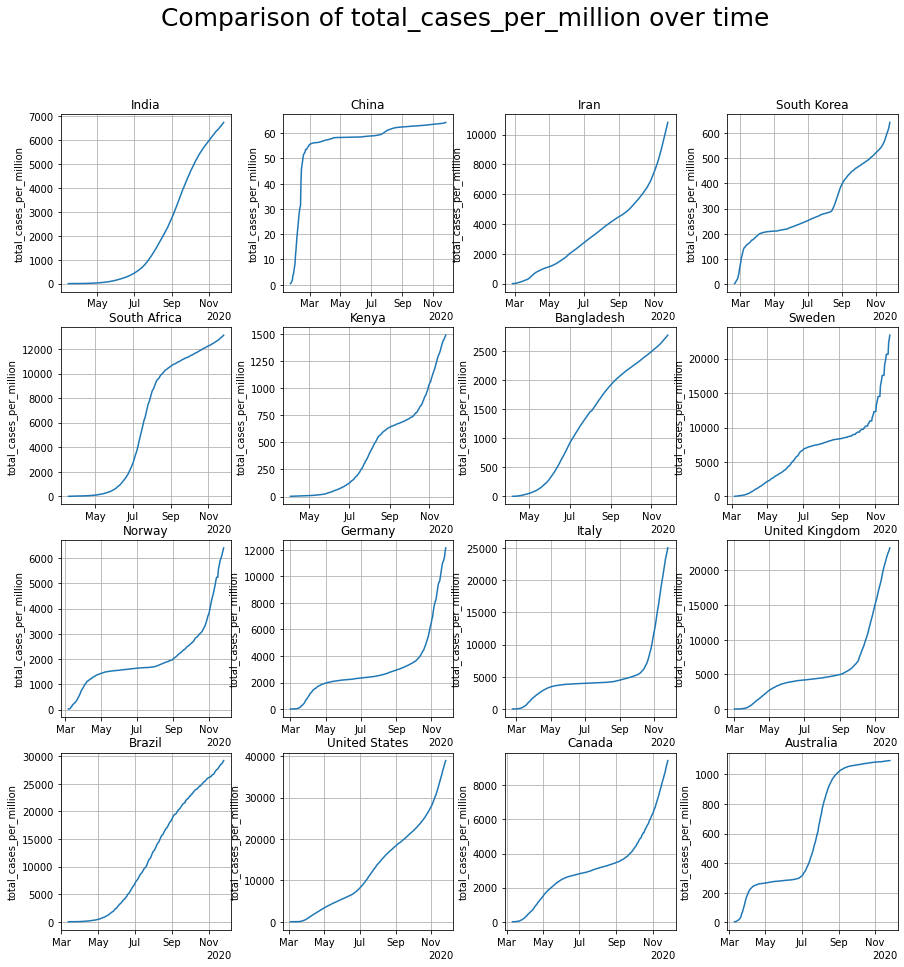

<Figure size 1800x1800 with 0 Axes>

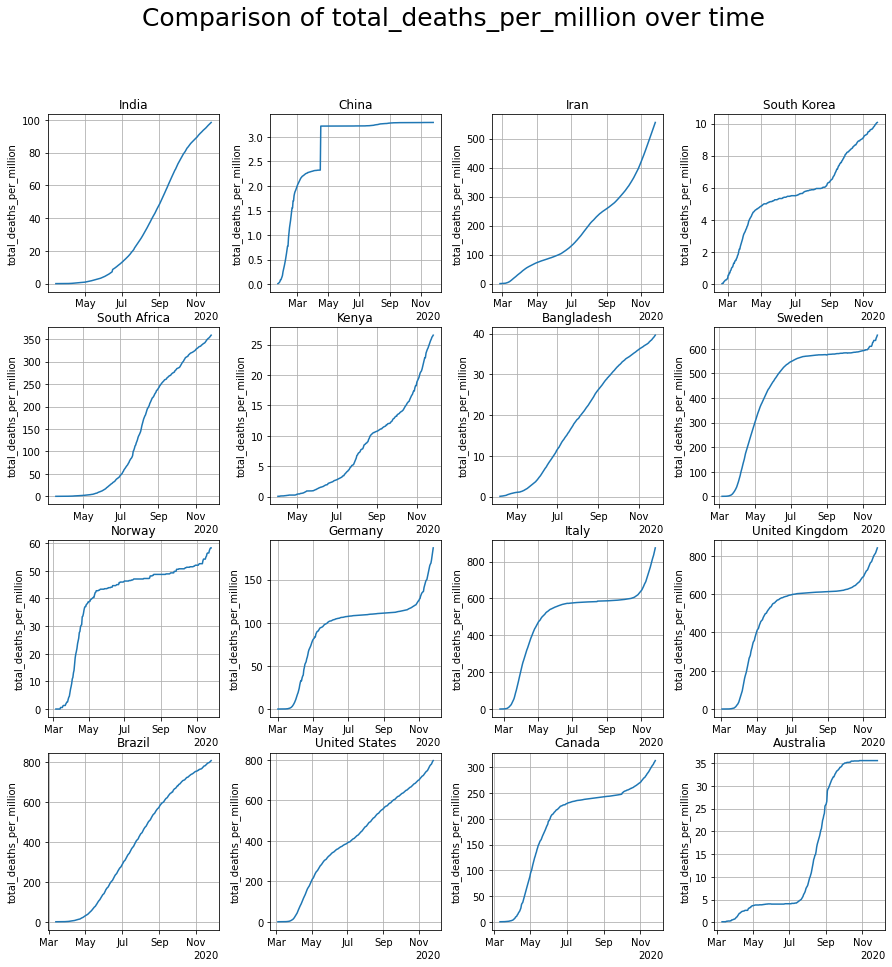

<Figure size 1800x1800 with 0 Axes>

In [15]:
plot_comparison_over_time('total_cases_per_million')
plot_comparison_over_time('total_deaths_per_million')

Pie chart Diagram total confirmed cases on considered countries 

In [16]:
total_confirmed_cases = []  # Total confirmed Cases on considered countries
for location in considered_location:
    total_confirmed_cases.append(df.loc[df['location'] == location,
                                        'total_cases'].values[-1])


In [17]:
def plot_pie_charts(x, y, title):
    c = random.choices(list(mcolors.CSS4_COLORS.values()),
                       k=len(considered_location))
    plt.figure(figsize=(12, 12))
    plt.title(title, size=16)
    plt.pie(y, colors=c)
    plt.legend(x, loc='best', fontsize=15)
    plt.show()

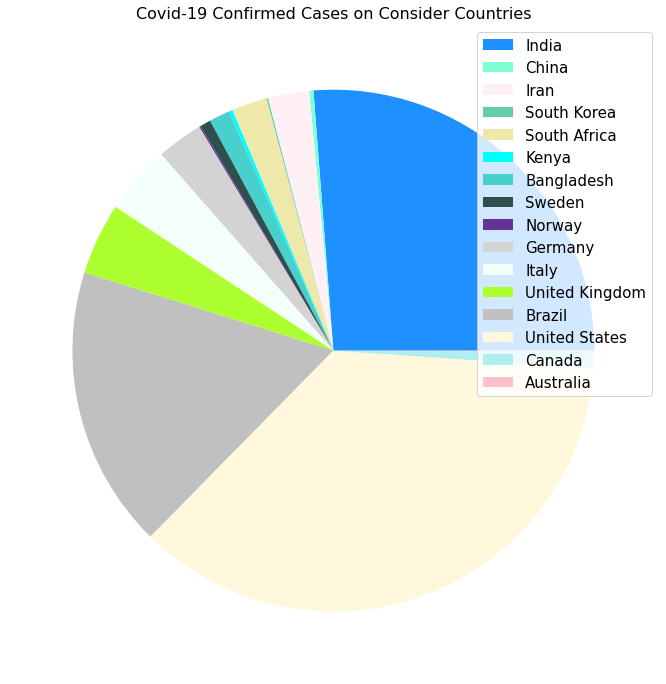

In [18]:
plot_pie_charts(considered_location, total_confirmed_cases,
                'Covid-19 Confirmed Cases on Consider Countries')

On the above pie chart we have shown the total number of cases for considered countries.

In [19]:
considered_countries = df_considered_location.pivot(
    index='location', columns='date', values='total_cases').fillna(0)

In [20]:
# Find latitude and longitude values for the selected countries
latitude = [-32, 24, -14, 47, 32, 51, 20, 32, 42, 0, 60, -30, 37, 59, 51, 40]
longitude = [
    141, 90, -52, -80, 111, 10, 79, 53, 12, 38, 8, 23, 128, 19, 0, -100
]

# Add the latitude and longitude values into the dataset
considered_countries['latitude'] = latitude
considered_countries['longitude'] = longitude
df_map = considered_countries
df_map = df_map.reset_index('location')

#Unpivot the DataFrame from wide to long format
pivot_wide_long = pd.melt(frame=df_map,
                          id_vars=['location', 'longitude', 'latitude'],
                          var_name='date',
                          value_vars=considered_countries.iloc[:, 3:-2],
                          value_name='count')

In [21]:
# Plotly for visualization.

fig = px.scatter_geo(pivot_wide_long,
                     lat='latitude',
                     lon='longitude',
                     color='location',
                     hover_name='location',
                     size="count",
                     size_max=40,
                     animation_frame='date',
                     template='plotly_dark',
                     projection="natural earth",
                     title='COVID-19 worldwide confirmed cases over time')
fig

## Clustering

Data with similar features can be categorized and labelled and in data science, this is called clustering. In this part we will introduce different methods of clustering and use different parameters to cluster the cleaned Covid-19 dataset. Lastly a comparison of the methods is conducted.

### Kmeans and Agglomerative

In this section, we have analyzed the data set and tried to identify the coorelation among the columns. First we have taken a number of columns and then narrowed down the number of columns as we have seen that for every cases the coorelation exisits among the data of cases and deaths.

Later we have implemtned the clustering algorithms to cluster the data based on the coorelation that is observed.

At the end of the clustering, a comparison between the clustering algorithms is done and an interesting result is observed.

<AxesSubplot:>

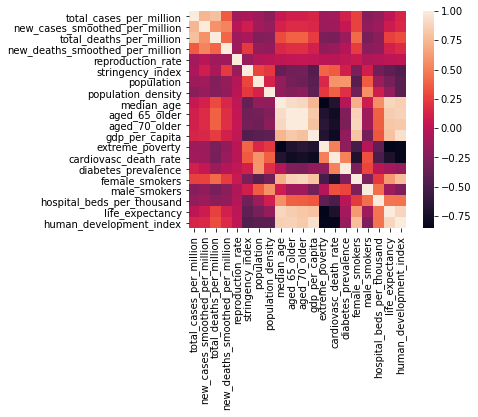

In [22]:
df_kmeans = df[[
    'total_cases_per_million', 'new_cases_smoothed_per_million',
    'total_deaths_per_million', 'new_deaths_smoothed_per_million',
    'reproduction_rate', 'stringency_index', 'population',
    'population_density', 'median_age', 'aged_65_older', 'aged_70_older',
    'gdp_per_capita', 'extreme_poverty', 'cardiovasc_death_rate',
    'diabetes_prevalence', 'female_smokers', 'male_smokers',
    'hospital_beds_per_thousand', 'life_expectancy', 'human_development_index'
]]
coorelation = df_kmeans.corr()
sns.heatmap(coorelation, square=True)

The correlation plot indicates a strong correlation between the confirmed cases and deaths. Thus, we have narrowed down the number of columns to consider. 

<AxesSubplot:>

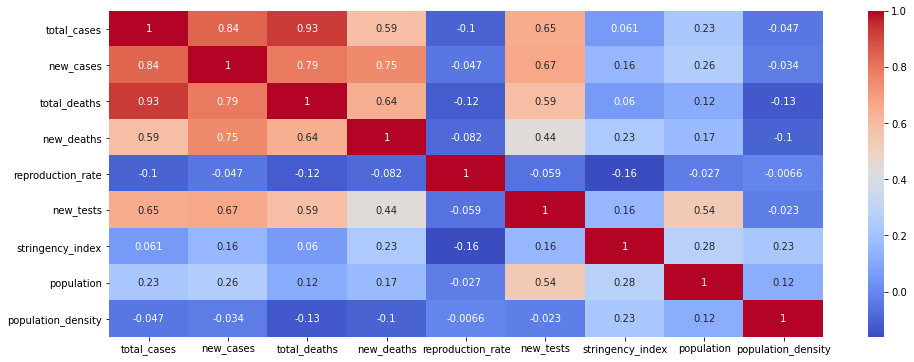

In [23]:
df1 = df[[
    'total_cases',
    'new_cases',
    'total_deaths',
    'new_deaths',
    'reproduction_rate',
    'new_tests',
    'stringency_index',
    'population',
    'population_density',
]]
plt.figure(figsize=(16, 6))
coorelation = df1.corr()
sns.heatmap(coorelation, annot=True, cmap='coolwarm')

The above is also looks same the earlier one. the coorelation is lies among the cases and deaths. Thus, in below we have tried a different way to look into. We have filtered the data based on the countries and and taken the mean of the new cases and new deaths columns.

In [24]:
unique_considered_countries = df['location'].unique()

max_total_cases = df.groupby(by=['location'])['total_cases'].max()
max_total_cases = np.array(max_total_cases)

max_total_deaths = df.groupby(by=['location'])['total_deaths'].max()
max_total_deaths = np.array(max_total_deaths)

mean_new_cases = df.groupby(by=['location'])['new_cases'].mean()
mean_new_cases = np.array(mean_new_cases)

mean_new_deaths = df.groupby(by=['location'])['new_deaths'].mean()
mean_new_deaths = np.array(mean_new_deaths)

unique_population = df['population'].unique()

unique_population_density = df['population_density'].unique()

cleaned_data = np.vstack([
    unique_considered_countries, max_total_cases, max_total_deaths,
    mean_new_cases, mean_new_deaths, unique_population,
    unique_population_density
])
cleaned_data = cleaned_data.T

In [25]:
new_data = pd.DataFrame({
    'location': cleaned_data[:, 0],
    'total_cases': cleaned_data[:, 1],
    'total_deaths': cleaned_data[:, 2],
    'new_cases': cleaned_data[:, 3],
    'new_deaths': cleaned_data[:, 4],
    'population': cleaned_data[:, 5],
    'population_density': cleaned_data[:, 6]
})
#new_data

In [26]:
new_data = new_data[[
    'total_cases', 'total_deaths', 'new_cases', 'new_deaths', 'population',
    'population_density'
]]
new_data['total_cases'] = new_data['total_cases'].astype(
    {'total_cases': 'float64'})
new_data['total_deaths'] = new_data['total_deaths'].astype(
    {'total_deaths': 'float64'})
new_data['new_deaths'] = new_data['new_deaths'].astype(
    {'new_deaths': 'float64'})
new_data['new_cases'] = new_data['new_cases'].astype({'new_cases': 'float64'})
new_data['population'] = new_data['population'].astype(
    {'population': 'float64'})
new_data['population_density'] = new_data['population_density'].astype(
    {'population_density': 'float64'})

Here below, we have also observed the same coorelation.

<AxesSubplot:>

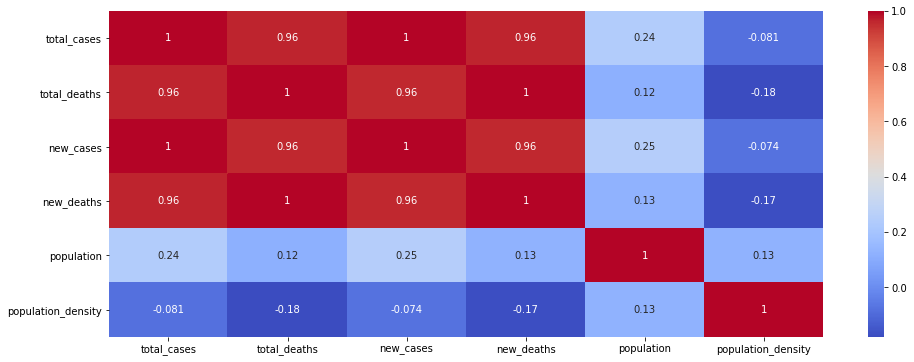

In [27]:
plt.figure(figsize=(16, 6))
coorelation = new_data.corr()
coorelation
sns.heatmap(coorelation, annot=True, cmap='coolwarm')

<AxesSubplot:>

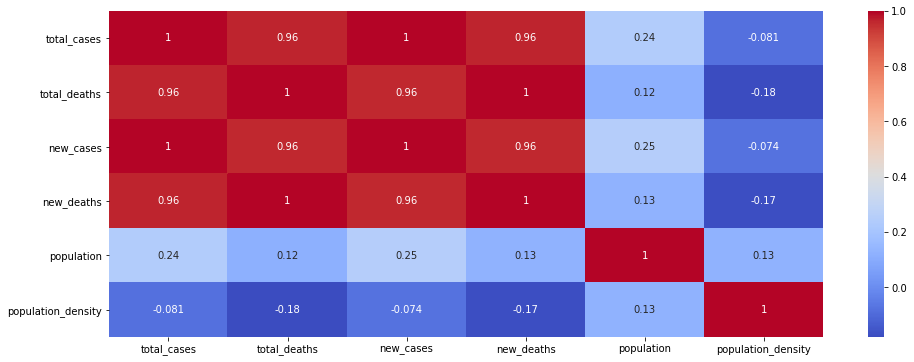

In [28]:
plt.figure(figsize=(16, 6))
coorelation = new_data.corr()
coorelation
sns.heatmap(coorelation, annot=True, cmap='coolwarm')

Now to look from a different angle, we have take the full data set for a single country and the found the same result as well.

In [29]:
one_country_Aus = df[df['location'] == 'Australia']

In [30]:
one_country_Aus = one_country_Aus[[
    'total_cases', 'new_cases', 'total_deaths', 'new_deaths',
    'reproduction_rate', 'new_tests', 'stringency_index'
]]

<AxesSubplot:>

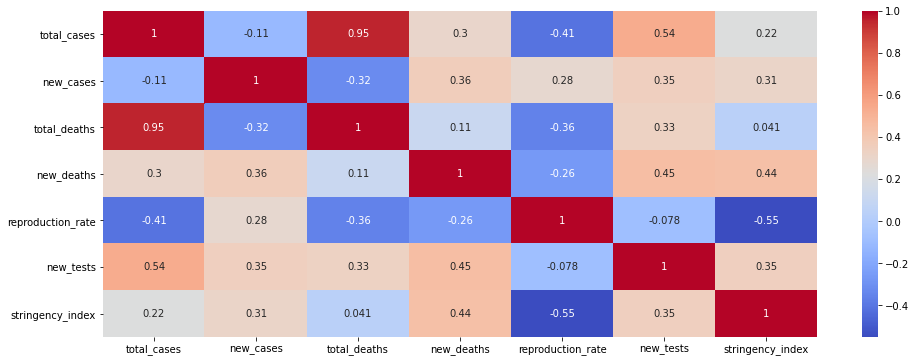

In [31]:
plt.figure(figsize=(16, 6))
coorelation = one_country_Aus.corr()
coorelation
sns.heatmap(coorelation, annot=True, cmap='coolwarm')

Since from every angle we got the same outcome, we have decided to implement the clustering algorithms now to see how the data point looks like and how many clusters the the algorithms suggest.

Also before implementing the clustering, we have done some preprocessing of the data, for example; we have scaled the data to maintain the uniformity in terms of variances.

In [32]:
df1 = df1.fillna(0.0)
gen_scaled_df = StandardScaler()
gen_scaled_data = gen_scaled_df.fit_transform(df1)
gen_scaled_data[:1]

array([[-0.40816126, -0.42925076, -0.52323083, -0.51768063, -2.41511226,
        -0.46377505, -2.97575166, -0.52395539, -0.67660181]])

In [33]:
contfilt_scaled_df = StandardScaler()
contfilt_scaled_data = contfilt_scaled_df.fit_transform(new_data)
contfilt_scaled_data[:1]

array([[-0.59098066, -0.66444374, -0.59169191, -0.66356051, -0.51473849,
        -0.66767315]])

Here this custom method contains the implementation of the one of the most popular clustering agorithm named K-means and this method returns labels of the data set, sse error and centers of the clusters.

In [34]:
def kmeans_clustreing(X, num_of_cluster=4):
    data_model = KMeans(num_of_cluster, max_iter=10000)
    data_model.fit(X)
    #labels_of_cluster = data_model.predict(X)
    labels_of_cluster = data_model.labels_
    cluster_centre = data_model.cluster_centers_
    sse = data_model.inertia_
    return (sse, labels_of_cluster, cluster_centre)

Now the algorythom has been implemented on both the original data set and the filtered dataset.

In [35]:
gen_sse_error, gen_labels_of_cluster, gen_cluster_centre = kmeans_clustreing(
    gen_scaled_data, 4)
kmeans = pd.DataFrame(gen_labels_of_cluster)
df1['kmeans'] = kmeans
df1

,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,new_tests,stringency_index,population,population_density,kmeans
0,107.0,16.0,3.0,0.0,0.00,2554.553571,19.44,25499881.0,3.202,0
1,128.0,21.0,3.0,0.0,2.12,2554.553571,19.44,25499881.0,3.202,0
2,128.0,0.0,3.0,0.0,2.16,2554.553571,19.44,25499881.0,3.202,0
3,200.0,72.0,3.0,0.0,2.30,2554.553571,19.44,25499881.0,3.202,0
4,250.0,50.0,3.0,0.0,2.30,2554.553571,19.44,25499881.0,3.202,0
...,...,...,...,...,...,...,...,...,...,...
4247,208295.0,0.0,6406.0,0.0,1.57,2741.000000,50.00,10099270.0,24.718,0
4248,208295.0,0.0,6406.0,0.0,1.57,7.000000,50.00,10099270.0,24.718,0
4249,225560.0,17265.0,6500.0,94.0,1.57,7726.000000,53.70,10099270.0,24.718,0
4250,230514.0,4954.0,6555.0,55.0,1.57,7538.000000,53.70,10099270.0,24.718,0


In [36]:
sse_error, labels_of_cluster, cluster_centre = kmeans_clustreing(
    contfilt_scaled_data, 4)
kmeans = pd.DataFrame(labels_of_cluster)
new_data['kmeans'] = kmeans
new_data

,total_cases,total_deaths,new_cases,new_deaths,population,population_density,kmeans
0,27873.0,907.0,106.038168,3.450382,2.549988e+07,3.202,0
1,456438.0,6524.0,1941.914894,27.723404,1.646894e+08,1265.036,2
2,6204220.0,171460.0,23954.316602,662.007722,2.125594e+08,25.040,1
3,356650.0,11818.0,1366.172414,45.275862,3.774216e+07,4.037,0
4,92488.0,4742.0,297.540453,15.291262,1.439324e+09,147.674,3
5,1017830.0,15640.0,3755.538745,57.712177,8.378394e+07,237.016,0
6,9309787.0,135715.0,36084.127907,526.019380,1.380004e+09,450.419,1
7,908346.0,46689.0,3302.730909,169.720000,8.399295e+07,49.831,0
8,1509875.0,52850.0,5430.982014,190.100719,6.046183e+07,205.859,0
9,80102.0,1427.0,334.815900,5.966527,5.377130e+07,87.324,0


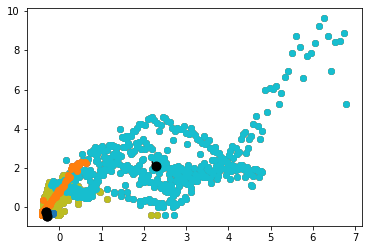

In [37]:
u1_labels = np.unique(labels_of_cluster)
for cl in range(1, 4):
    for i in u1_labels:
        plt.scatter(gen_scaled_data[gen_labels_of_cluster == i, 0],
                    gen_scaled_data[gen_labels_of_cluster == i,
                                    1])  #, kmeans = i)
    plt.scatter(gen_cluster_centre[:, 0],
                gen_cluster_centre[:, cl],
                s=80,
                color='k')

plt.show()

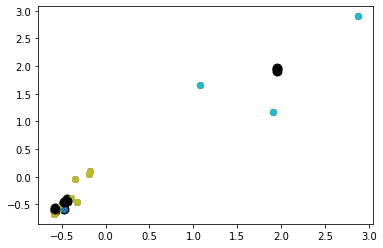

In [38]:
u2_labels = np.unique(labels_of_cluster)
for cl1 in range(0, 3):
    for i in u2_labels:
        plt.scatter(contfilt_scaled_data[labels_of_cluster == i, 0],
                    contfilt_scaled_data[labels_of_cluster == i,
                                         1])  #, kmeans = i)
    plt.scatter(cluster_centre[:, 0], cluster_centre[:, cl1], s=80, color='k')

plt.show()

Here we have implemented the Agglomerative clustering and found that the clustering outcome is alomost same as K-means.

In [39]:
def agglomerative_clustring(X, num_of_cluster_ag=8):
    data_model_ag = AgglomerativeClustering(n_clusters=num_of_cluster_ag,
                                            affinity='euclidean',
                                            linkage='ward')
    #data_model_ag = AgglomerativeClustering(affinity = 'euclidean', linkage = 'ward')
    labels_of_cluster_ag = data_model_ag.fit_predict(X)
    #sse_ag = labels_of_cluster_ag.inertia_
    clf = NearestCentroid()
    clf.fit(X, labels_of_cluster_ag)
    centers_ag = clf.centroids_
    #print(clf.centroids_)
    #print(centers_ag)
    return (labels_of_cluster_ag, centers_ag)

In [40]:
labels_of_cluster_ag, cluster_center_ag = agglomerative_clustring(
    contfilt_scaled_data, 4)
agglomerative = pd.DataFrame(labels_of_cluster_ag)
new_data_ag = new_data
new_data_ag['agglomerative'] = agglomerative

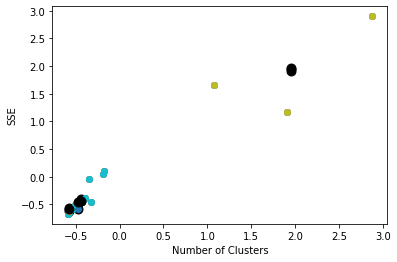

In [41]:
u3_labels = np.unique(labels_of_cluster_ag)
for cl1 in range(0, 3):
    for i in u3_labels:
        plt.scatter(contfilt_scaled_data[labels_of_cluster_ag == i, 0],
                    contfilt_scaled_data[labels_of_cluster_ag == i,
                                         1])  #, kmeans = i)
    plt.scatter(cluster_center_ag[:, 0],
                cluster_center_ag[:, cl1],
                s=80,
                color='k')

plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In the above plots, we can see that we have genreated 4 clusters and there are 4 cluster centers were generated. Now with regard the right number of clusters we wold like to simuulate the algorythm once again and would generate the SSE and plot it to check how it looks and if this gives an indication of the right number of clusters.

For this purpose we would implement two methods namely, elbow method and silhouette coefficient method.

In [42]:
kmeans_parameters = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_parameters)
    kmeans.fit(new_data)
    sse.append(kmeans.inertia_)

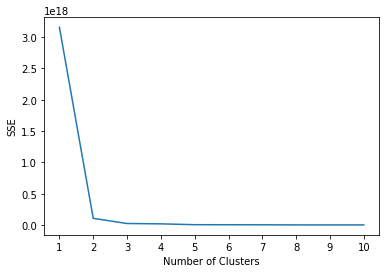

In [43]:
#plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In the above plot we can see that the when we implement the SSE as a function of the number of clusters, SSE continues to go down and we inclease the number of iteration. And we ca see a clear elbo point that indicates that right number of clusters.

Now in below we will generate the Silhouette Coefficient to check the for how many clusters this got the highest. 

In [44]:
silhouette_coeff = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_parameters)
    kmeans.fit(new_data)
    sscore = silhouette_score(new_data, kmeans.labels_)
    silhouette_coeff.append(sscore)

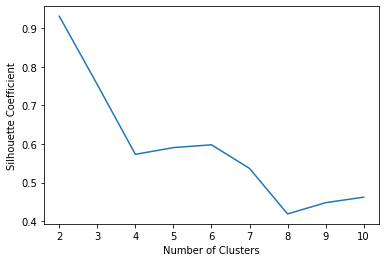

In [45]:
#plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coeff)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In the above plot we can see that for the number of clusters 2 it scores the highest. Thus we can decide that the optimum number of clusters would be 2. Now we can generate the plot again and we can see that the plot looks good with two centroids.

In [46]:
rev_sse_error, rev_labels_of_cluster, rev_cluster_centre = kmeans_clustreing(
    contfilt_scaled_data, 2)
kmeans = pd.DataFrame(labels_of_cluster)
new_data['kmeans'] = kmeans
new_data

,total_cases,total_deaths,new_cases,new_deaths,population,population_density,kmeans,agglomerative
0,27873.0,907.0,106.038168,3.450382,2.549988e+07,3.202,0,1
1,456438.0,6524.0,1941.914894,27.723404,1.646894e+08,1265.036,2,2
2,6204220.0,171460.0,23954.316602,662.007722,2.125594e+08,25.040,1,0
3,356650.0,11818.0,1366.172414,45.275862,3.774216e+07,4.037,0,1
4,92488.0,4742.0,297.540453,15.291262,1.439324e+09,147.674,3,3
5,1017830.0,15640.0,3755.538745,57.712177,8.378394e+07,237.016,0,1
6,9309787.0,135715.0,36084.127907,526.019380,1.380004e+09,450.419,1,0
7,908346.0,46689.0,3302.730909,169.720000,8.399295e+07,49.831,0,1
8,1509875.0,52850.0,5430.982014,190.100719,6.046183e+07,205.859,0,1
9,80102.0,1427.0,334.815900,5.966527,5.377130e+07,87.324,0,1


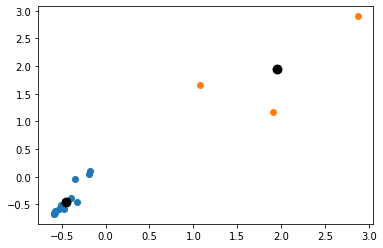

In [47]:
u4_labels = np.unique(rev_labels_of_cluster)
for cl3 in range(0, 1):
    for i in u4_labels:
        plt.scatter(contfilt_scaled_data[rev_labels_of_cluster == i, 0],
                    contfilt_scaled_data[rev_labels_of_cluster == i,
                                         1])  #, kmeans = i)
    plt.scatter(rev_cluster_centre[:, 0],
                rev_cluster_centre[:, cl3],
                s=80,
                color='k')

plt.show()

### Comparison of Kmeans and DBscan

Now at a further level we can compare the performance and eficiency of the algorythms that is used for clustering.

Through the elbow and silhouette coefficient clustering performance can be measured without the use of ground truth labels. 
Through the ground truth labels data points are categorized and assigned. Using these metrics we can identify the correct number of clusters but no always as this process gives wrong idication sometimes.

In [48]:
comp_features, true_labels_mm = make_moons(n_samples=1500,
                                           noise=0.05,
                                           random_state=42)
contfilt_scaled_data = contfilt_scaled_df.fit_transform(comp_features)

Here we have implemented both k_means and DBScan algorithms to generate the silhouette score for the of them. We have generated them and we can see that the silhouette score is higher for the K-means and as we know the higher the silhouette score indicates the more accuracy. Thus it is seemed that the K-means is the effective one for the clustering in comparing with the DBSCN algorithm.

In [49]:
ini_kmeans_v = KMeans(n_clusters=2)
ini_dbscan_v = DBSCAN(eps=0.3)
# Fit the algorithms to the features
ini_kmeans_v.fit(contfilt_scaled_data)
ini_dbscan_v.fit(contfilt_scaled_data)
# Compute the silhouette scores for each algorithm
kmeans_silhouette_score = silhouette_score(contfilt_scaled_data,
                                           ini_kmeans_v.labels_).round(2)
dbscan_silhouette_score = silhouette_score(contfilt_scaled_data,
                                           ini_dbscan_v.labels_).round(2)

In [50]:
kmeans_silhouette_score

0.5

In [51]:
dbscan_silhouette_score

0.39

Here in above we have used the make_moons method to generate synthetic data in the shape of crescents. And In the below plot we can see that though the though the silhouette score give the indication that k-means is the better clustering algorythm but still the below plot shows a smooth share with more natural datapoints. Thus, we could look into a further better algorithm for the clustering. 

Also we can identify the ARI-madjusted rand index scores to cehck which one is best as we have the true labels.

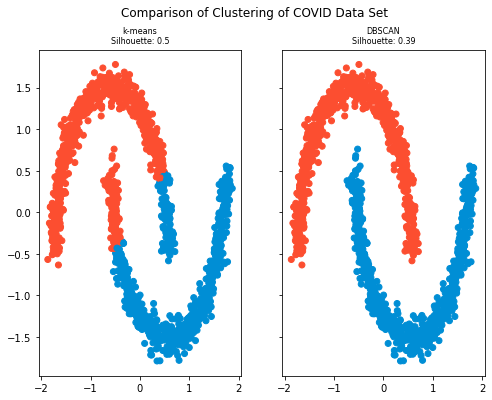

In [52]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 6), sharex=True, sharey=True)
fig.suptitle(f"Comparison of Clustering of COVID Data Set", fontsize=12)
fte_colors = {
    0: "#008ed5",
    1: "#fc4e30",
}
# The k-means plot
km_colors = [fte_colors[label] for label in ini_kmeans_v.labels_]
ax1.scatter(contfilt_scaled_data[:, 0],
            contfilt_scaled_data[:, 1],
            c=km_colors)
ax1.set_title(f"k-means\nSilhouette: {kmeans_silhouette_score}",
              fontdict={"fontsize": 8})
# The dbscan plot
db_colors = [fte_colors[label] for label in ini_dbscan_v.labels_]
ax2.scatter(contfilt_scaled_data[:, 0],
            contfilt_scaled_data[:, 1],
            c=db_colors)
ax2.set_title(f"DBSCAN\nSilhouette: {dbscan_silhouette_score}",
              fontdict={"fontsize": 8})
plt.show()

### Agglomerative
In this section we will cluster the countries based only on data for confirmed cases per million and deaths per million. This will be done by calculating the pairwise distance between the countries' time series, which is further used to fit an agglomerative model.

**Hierarchical clustering - Agglomerative based on confirmed cases per million**

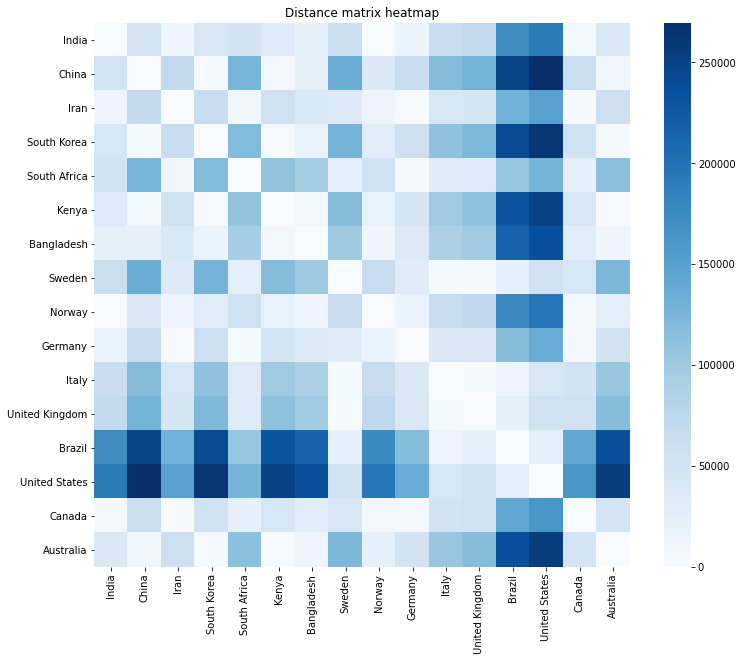

In [53]:
def to_series(df, considered_locations, cluster_var):
    """
    Extract the cluster variable for each country as a series

    :param df:                   Pandas dataframe containing covid-19 data
    :param considered_locations: List of locations
    :param cluster_var:          Variable to cluster locations by
    
    return list: Series, cluster variable for all considered locations
    """
    series = []
    for location in considered_locations:
        df_loc = df.loc[df['location'] == location]
        s = np.array(1000000 * df_loc[cluster_var] / df_loc['population'])
        series.append(s)
    return series


# Calculate the pairwise distances between each country
def dtw_distances(series):
    """
    Dynamic time warping for distance calculation
    :param series: Cluster variable for all locations
    
    :return dataframe: The distance matrix as pandas dataframe
    """
    dist_matrix = dtw.distance_matrix(series)
    dist_df = pd.DataFrame(data=dist_matrix,
                           index=considered_location,
                           columns=considered_location)
    return dist_df


def to_full_matrix(dist_df):
    """
    Process the distance dataframe
    Replace the "inf" values such that lower triangle = upper triangle
    Finally replace the "inf" values on the diagonal with 0
    
    :param dist_df: distance matrix as Pandas dataframe
    
    :return dataframe: Uncondensed distance matrix
    """
    for col in dist_df.columns:
        dist_df[col] = dist_df.loc[col]

    dist_df = dist_df.replace([np.inf, -np.inf], 0.0)
    return dist_df


# Visualize the matrix with a heatmap
def plot_matrix(df):
    """
    Visualize the distance matrix using heatmap
    """
    fig = plt.figure(figsize=(12, 10))
    sns.heatmap(df, cmap='Blues').set_title('Distance matrix heatmap')


def silhouette_plot_find_k(distances, kmax=10):
    """
    Plot the silhouette score for different values of k
    
    :param distances: Distance matrix
    
    :return float: Most optimal number of clusters
    """
    sil = []
    for k in range(2, kmax + 1):
        model = AgglomerativeClustering(n_clusters=k).fit(distances)
        labels = model.labels_
        sil.append(silhouette_score(distances, labels, metric='euclidean'))

    fig = plt.figure()
    plt.plot(np.arange(2, kmax + 1, 1), sil)
    plt.title('Silhouette score vs k')
    plt.xlabel('k')
    plt.ylabel('Score')
    return sil.index(max(sil)) + 2


def run_clustering(df, k):
    """
    Cluster the data in k clusters
    
    :param df: pandas dataframe
    :param k:  number of clusters
    
    :return: Pandas dataframe containing locations and corresponding clusters
    """
    model = AgglomerativeClustering(n_clusters=k).fit(df)
    clusters = pd.DataFrame({
        'location': df.index.values,
        'Cluster': model.labels_
    })

    return clusters


def prep_df_and_plot(df, cluster_data, cluster_var):
    """
    Plot the total cases development for each location with cluster labels
    
    :param df:           Pandas dataframe containing time series data for locations
    :param cluster_data: Pandas dataframe, location and cluster number
    :param cluster_var:  clustering variable
    """
    # Merge the cluster data and time series data
    clustered_df = pd.merge(df, cluster_data, on='location')

    # Sort by location such that correct cluster is "appended" to correct location
    clustered_df = clustered_df.sort_values('location')
    cluster_data = cluster_data.sort_values('location')

    clusters_for_linestyles = clustered_df.groupby('Cluster')

    fig, ax = plt.subplots(figsize=(20, 15))
    clustered_df[cluster_var] = 1000000 * clustered_df[
        cluster_var] / clustered_df['population']

    # Need to increase this if k>4
    linestyles = {0: '-', 1: ':', 2: '--', 3: '-.'}

    linestyles_cluster = list(map(linestyles.get, cluster_data.Cluster))
    clustered_df.groupby('location').plot(
        kind='line',
        x='date',
        y=cluster_var,
        ax=ax,
        title='Visualization of countries in the different clusters')

    # Set linestyle for each line based on its cluster
    for i, line in enumerate(ax.lines):
        line.set_linestyle(linestyles_cluster[i])
    ax.legend(clustered_df.location.unique())
    plt.ylabel(cluster_var + ' per million')
    plt.show()


series = to_series(df, considered_location, 'total_cases')
dist_df = dtw_distances(series)
dist_df = to_full_matrix(dist_df)
plot_matrix(dist_df)

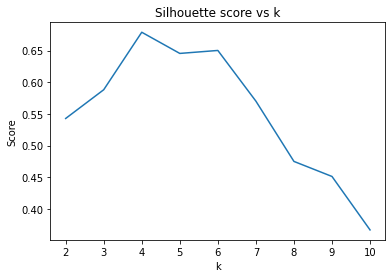

In [54]:
k = silhouette_plot_find_k(dist_df)
clusters = run_clustering(dist_df, k)

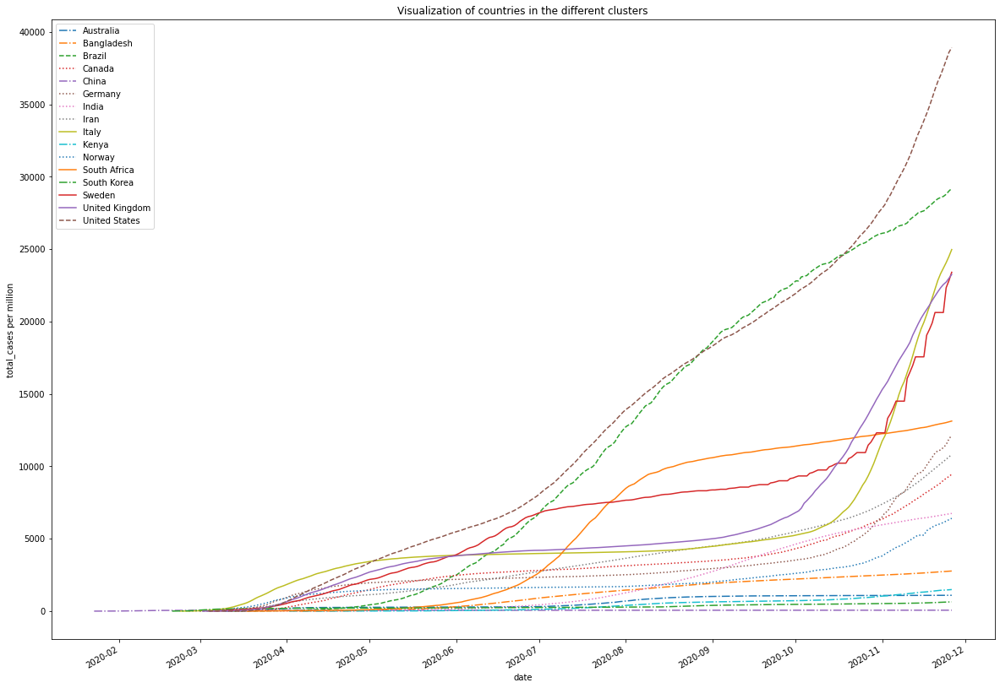

In [55]:
prep_df_and_plot(df, clusters, 'total_cases')

As we can see, the clustering results based on confirmed cases over time proves to be promising. There is a clear distinction separating the different clusters, represented by the linestyles.


The sklearn library does not include a visualization tool for dendrograms. Therefore, the plot_dendrogram function below is actually implemented by sklearn (using scipy) as example code to visualize dendrogram for hierarchical clustering[5]. We will use this function here in order to visualize our results with a dendrogram.

Text(0, 0.5, 'Distance')

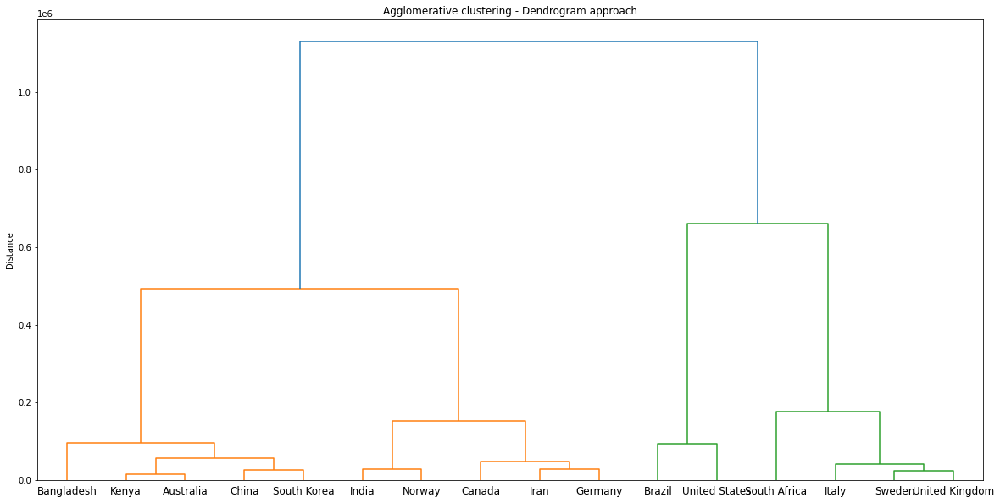

In [56]:
def plot_dendrogram(distances, **kwargs):
    """
    Create linkage matrix and then plot the dendrogram
    
    :param distances: distance matrix
    """
    # Calculate the full tree by setting n_clusters=None, distance_threshold=0
    model = AgglomerativeClustering(n_clusters=None,
                                    distance_threshold=0).fit(distances)

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs, labels=list(distances.index))


fig = plt.figure(figsize=(20, 10))
plot_dendrogram(dist_df)
plt.title('Agglomerative clustering - Dendrogram approach')
plt.ylabel('Distance')

Forcing the model to calculate the full tree, we can see that the same countries fall under the clusters as in our agglomerative model.

**Agglomerative clustering based on total deaths per million**

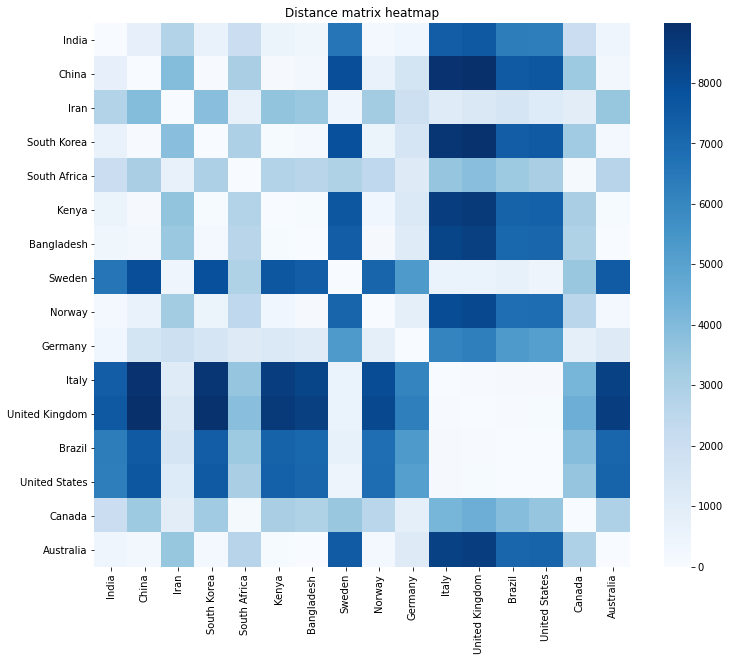

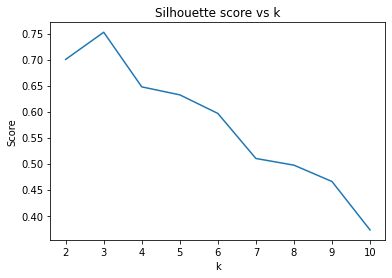

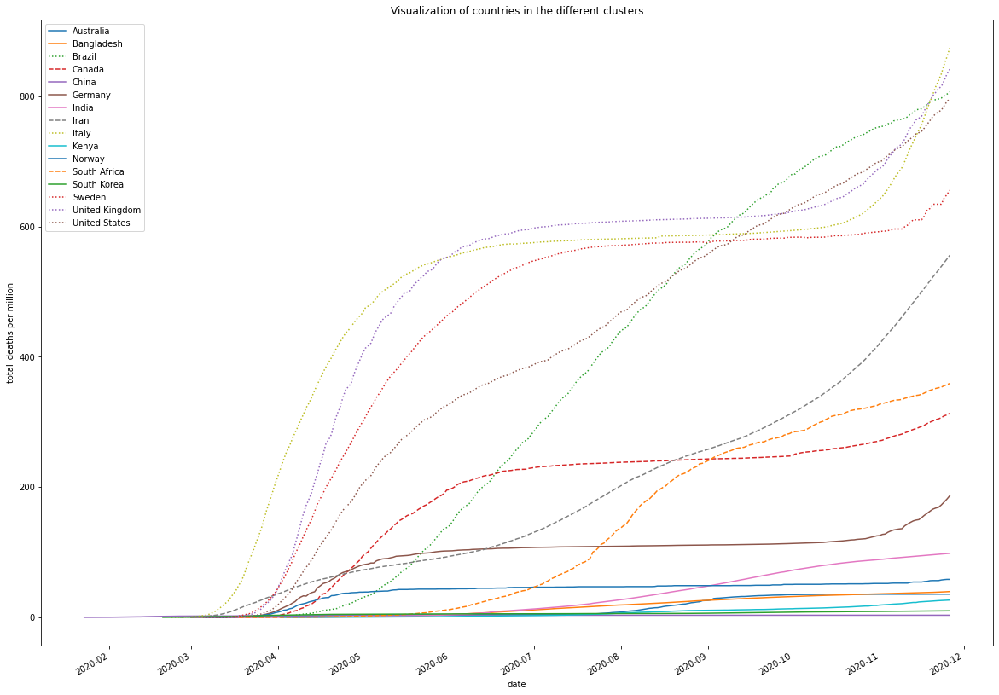

In [57]:
series = to_series(df, considered_location, 'total_deaths')
dist_df = dtw_distances(series)
dist_df = to_full_matrix(dist_df)
plot_matrix(dist_df)
k = silhouette_plot_find_k(dist_df)
clusters_ft = run_clustering(dist_df, k)
prep_df_and_plot(df, clusters_ft, 'total_deaths')

Once again, one can observe that similar trends fall under same clusters. It is worth mentioning that the optimal number of clusters is 3 for total deaths per million, compared to 4 for total cases per million. 

### K-means - row wise

K-means 

<AxesSubplot:>

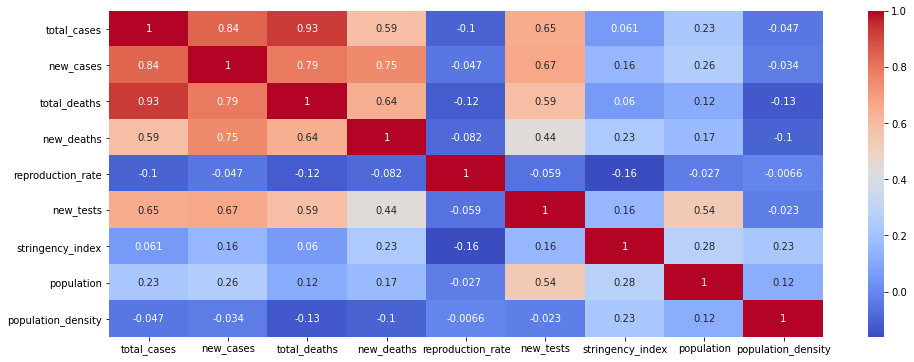

In [58]:
df1 = df[[
    'total_cases',
    'new_cases',
    'total_deaths',
    'new_deaths',
    'reproduction_rate',
    'new_tests',
    'stringency_index',
    'population',
    'population_density',
]]
plt.figure(figsize=(16, 6))
coorelation = df1.corr()
sns.heatmap(coorelation, annot=True, cmap='coolwarm')

In [59]:
df_kmeans = df_kmeans.fillna(0.0)
scaled_df = StandardScaler()
scaled_data = scaled_df.fit_transform(df_kmeans)

In [60]:
def kmeans_clustreing(X, num_of_cluster=8):
    data_model = KMeans(num_of_cluster)
    data_model.fit(X)
    #labels_of_cluster = data_model.predict(X)
    labels_of_cluster = data_model.labels_
    cluster_centre = data_model.cluster_centers_
    sse = data_model.inertia_
    return (sse, labels_of_cluster, cluster_centre)


sse_error, labels_of_cluster, cluster_centre = kmeans_clustreing(
    scaled_data, 4)
#print(labels_of_cluster)
#print(cluster_centre)
kmeans = pd.DataFrame(labels_of_cluster)
df_kmeans['kmeans'] = kmeans
df_kmeans['location'] = df.location
df_kmeans['counts'] = 1

In [61]:
grouped_df_kmeans = df_kmeans.groupby(['location',
                                       'kmeans']).sum().reset_index()
clusters.rename(columns={'Cluster': 'Agglomerative'}, inplace=True)
clusters.set_index('location', inplace=True)
clusters['kmeans_row_wise1'] = grouped_df_kmeans[['location', 'kmeans'
                                                  ]].groupby('location').nth(0)
clusters['kmeans_row_wise2'] = grouped_df_kmeans[['location', 'kmeans'
                                                  ]].groupby('location').nth(1)

### K-means of clustered data

For this part we will look into a method for clustering data by location after clustering data by row. The reason for implementing this is so that the row-wise clustering will dictate which clusters each country belong to. Then we will compare it with the other clustering results.

The idea behind the clustering of clusterings is to group by states, and base the clustering of countries on the amount of time they spend in a state.

The first clustering, kmeans of each row, will classify rows that are similar as a 'state' for a country. When using cumulative data, this 'state' can be though of as a 'stage'. When this is calculated for the whole data set, it is possible to count the amount of occurances of every stage for each country. Then the counts can be represented in a dataframe where locations are the indecies and cluster labels would be the column names. This dataframe can now be clustered by the k-means algoritm, and new labels will be distributed to each country.

In [62]:
def kmeans_of_clustered(dataframe_in, cluster_column, show_counts=False, k=4):
    """
  Will use the dataframe and assosiated cluster series to output location as index and assosiated new cluster label.
  The function will count the number of occurance of each cluster label from previous clustering (cluster_column) in each location.
  Then, the counts of previous cluster labels will determine the new cluster labels assosiated with each location by considering how many of each previous clustering label each location have.

  :param dataframe_in:    Dataframe with correct location and indexing assosiated with cluster_column
  :param cluster_column:  Dataframe, Series or list of cluster data with correct indexing of assosiated Dataframe
  :param show_counts:     Prints the dataframe that is being used in the kmeans function.

  :returns:               Pandas Series with location as index and assosiated cluster labels as data.
  """
    dataframe = dataframe_in.copy()
    dataframe = dataframe.loc[:, ['location']]
    dataframe['cluster'] = cluster_column
    dataframe['count'] = 1
    cluster_counts = dataframe.groupby(['location',
                                        'cluster']).sum().reset_index()

    manip_cluster_counts = pd.DataFrame(
        [],
        columns=range(len(cluster_counts.cluster.unique())),
        index=cluster_counts.location.unique())
    for row in cluster_counts.iterrows():
        manip_cluster_counts.loc[row[1].location,
                                 row[1].cluster] = row[1]['count']
    manip_cluster_counts = manip_cluster_counts.fillna(0.0)
    if show_counts:
        print(manip_cluster_counts)
    labels_second_clustering = kmeans_clustreing(manip_cluster_counts, k)[1]
    results = pd.Series(labels_second_clustering,
                        index=manip_cluster_counts.index)
    return results

The results of the clustering of clusters is stored in the clusters dataframe for later comparison:

In [63]:
df_second_kmeans = df.loc[:, [
    'total_cases_per_million', 'total_deaths_per_million', 'reproduction_rate'
]]
df_second_kmeans.fillna(0.0, inplace=True)
labels_for_second_kmeans = pd.DataFrame(
    kmeans_clustreing(scaled_df.fit_transform(df_second_kmeans), 8)[1])
clusters['kmeans_of_kmeans'] = kmeans_of_clustered(df,
                                                   labels_for_second_kmeans,
                                                   k=4)

In [64]:
clusters

,Agglomerative,kmeans_row_wise1,kmeans_row_wise2,kmeans_of_kmeans
location,,,,
India,1,1,NaN,2
China,3,1,NaN,0
Iran,1,0,1.0,3
South Korea,3,3,NaN,0
South Africa,0,2,NaN,3
Kenya,3,2,NaN,2
Bangladesh,3,1,NaN,0
Sweden,0,0,3.0,1
Norway,1,3,NaN,2


### Comparison

We want to compare the different clustering methods to get clues if the methods are coherent. Firstly we create a function to visually group the clusters: 

In [65]:
def cluster_groups(clusters_dataframe, clustering_method):
    """
  :param cluster_dataframe: dataframe with location as index and cluster method as columns
  :param clustering_method: string describing the clustering method wanted to show

  :return dataframe: returns a dataframe with clusters as columns and locations in the clusters as data. index is numerical
  """
    dataframe = clusters_dataframe[clustering_method].reset_index()
    dataframe['count'] = 1
    dataframe = dataframe.groupby([clustering_method,
                                   'location']).sum().reset_index()
    new_dataframe = pd.DataFrame(
        index=range(dataframe.groupby(clustering_method).sum()['count'].max()),
        columns=dataframe.loc[:, clustering_method].unique())

    for cluster_label in dataframe.loc[:, clustering_method].unique():
        new_dataframe[cluster_label] = (
            dataframe.loc[dataframe[clustering_method] ==
                          cluster_label].reset_index()['location'])
    new_dataframe.fillna('-', inplace=True)
    return new_dataframe

In [66]:
clusters = clusters.sort_values(['Agglomerative', 'kmeans_of_kmeans'])
clusters

,Agglomerative,kmeans_row_wise1,kmeans_row_wise2,kmeans_of_kmeans
location,,,,
Sweden,0,0,3.0,1
Italy,0,0,3.0,1
United Kingdom,0,0,3.0,1
South Africa,0,2,NaN,3
India,1,1,NaN,2
Norway,1,3,NaN,2
Germany,1,3,NaN,2
Iran,1,0,1.0,3
Canada,1,3,NaN,3


In [67]:
cluster_groups(clusters, 'Agglomerative')

,0,1,2,3
0,Italy,Canada,Brazil,Australia
1,South Africa,Germany,United States,Bangladesh
2,Sweden,India,-,China
3,United Kingdom,Iran,-,Kenya
4,-,Norway,-,South Korea


In [68]:
cluster_groups(clusters, 'kmeans_of_kmeans')

,0,1,2,3
0,Australia,Italy,Germany,Brazil
1,Bangladesh,Sweden,India,Canada
2,China,United Kingdom,Kenya,Iran
3,South Korea,-,Norway,South Africa
4,-,-,-,United States


In [69]:
cluster_groups(clusters, 'kmeans_row_wise1')

,0,1,2,3
0,Brazil,Bangladesh,Kenya,Australia
1,Iran,China,South Africa,Canada
2,Italy,India,-,Germany
3,Sweden,-,-,Norway
4,United Kingdom,-,-,South Korea
5,United States,-,-,-


In [70]:
cluster_groups(clusters, 'kmeans_row_wise2')

,1.0,3.0
0,Brazil,Italy
1,Iran,Sweden
2,-,United Kingdom
3,-,United States


As one can see from the groupings, the agglomerative clustering and the second k-means clustering seem to form similar groupings, with only few abbreviations. We are using the same data, total deaths per million and total cases per million, so we would expect a similar result given that the k-means of k-means is a valid clustering method. These results may indicate just that. The row wise clustering method, on the other hand, is not that greatly correlating with the other groupings. Having said that, the data is different in that case. For the row wise clustering, close to every column were considered, also the constants, which probably made most locations unique. However, some countries ended up in two groups.

## Predictions



In this chapter we use different machine learning/deep learning-based algorithms to forecast the outlook of covid-19 in the upcoming days. The specific methods explored in this chapter include
* Long short-term memory (LSTM) - Deep learning
* Polynomial regression - Machine learning
* Support vector machine (SVM) - Machine learning
* Random Forest regression - Machine learning
* Gradient Boosting Decision Tree (GMDT) - Machine learning.

Some of these will be based only on historical data for confirmed cases/deaths, while others will take into account various features of relevance for the development of covid-19.

### LSTM-Prediction Method
Long Short-term Memory Networks (LSTM) is a powerful network designed to handle sequence dependence called recurrent neural networks. It is well-suted to classifying, prcessing and making predictions based on time series data, since there can be lags of unknown duration between important events in a time series[5].


In [71]:
#df_total_cases = df.loc[df.location=='Germany']
df_total_cases = df.loc[df.location == 'China']
df_total_cases = df_total_cases[['total_cases']]
#Converting the dataframe to a numpy array
dataset = df_total_cases.values

# Number of rows to train
training_data_length = math.ceil(len(dataset) * 0.8)

# Scaling the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(dataset)

# Creating the training dataset
train_data = scaled_data[0:training_data_length, :]

# splitting the dta into x_train(independent) and y_train(target) dataset

x_train = []
y_train = []

for i in range(10, len(train_data)):
    x_train.append(train_data[i - 10:i, 0])
    y_train.append(train_data[i, 0])

# Converting the x_train and y_train to numpy arrays

x_train = np.array(x_train)
y_train = np.array(y_train)

# Resahaping x_train dataset: LSTM network requires the input to be in  3d in the form of numbr of samples,
# number of time steps and number of featurs. [sample, time steps, feature]

x_train = x_train.reshape((x_train.shape[0], x_train.shape[1], 1))

# Building the LSTM model:
model = Sequential()

model.add(LSTM(50, return_sequences=True, input_shape=(x_train.shape[1], 1)))
model.add(LSTM(50, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Training the model
model.fit(x_train, y_train, batch_size=1, epochs=1)

238/238 [==============================] - 1s 4ms/step - loss: 0.0148


In [72]:
# Creating testing dataset
# Create a new array containing scaled values from index ....''
test_data = scaled_data[training_data_length - x_train.shape[1]:, :]

#Create the dataset x_test and y_test
x_test = []
y_test = dataset[training_data_length:, :]
for i in range(10, len(test_data)):
    x_test.append(test_data[i - 10:i, 0])

# Coverting x_test to a numpy array
x_test = np.array(x_test)

# Reshaping the x_test also:
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

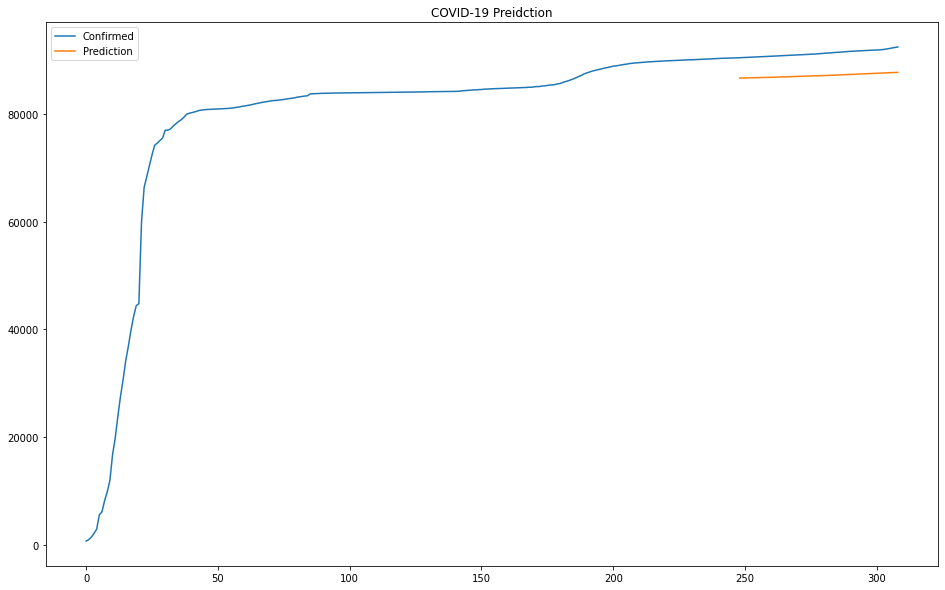

In [73]:
# Getting the model prediction case values
prediction = model.predict(x_test)

### Inverse transform to before scaling so we get actual numbers
rescaled_prediction = scaler.inverse_transform(prediction)

# Getting the root mean squared error (RMSE)
#rmse = np.sqrt(np.mean(rescaled_prediction-y_test)**2)

# plotting the datasets
train = df_total_cases[:training_data_length]
valid = df_total_cases[training_data_length:]
valid['Prediction'] = rescaled_prediction

train = train.reset_index(drop=True)
train['Prediction'] = np.nan
full_df = pd.concat([train, valid])
full_df = full_df.reset_index(drop=True)

# Visualize the data
plt.figure(figsize=(16, 10))
plt.title('COVID-19 Preidction')
plt.plot(full_df[['total_cases', 'Prediction']])
plt.legend(['Confirmed', 'Prediction'])

plt.show()

Based on the result obtained by LSTM-Networks as shown on the graph above, we can conclude that the technique is very usefull to make predictions about the future values on our historical data points.

### Polynomial Regression Analysis


For implementing the Polynomial Regression Algorithm we have followed the standard rules for prediction. In our model, firstly, we import libraries and the dataset which we can see at the top of this file. In the following section, we have done exploratory data analysis and processed the data. Before the prediction section we have trained our model for prediction using the training and test data.

In [74]:
"For Prediction Method, Find the total unique dates and calculating total number of cases on those days"
dates = df['date'].unique()
dates = dates[:-2]
world_date_wise_cases = df.groupby('date', as_index=False)['total_cases'].sum(
)  # Cnsidering only consideration countries
world_date_wise_cases.drop('date', axis='columns', inplace=True)
world_date_wise_cases = world_date_wise_cases[:-2]

# Date wise total cases based on specific countries
india_cases = []
china_cases = []
SK_cases = []
US_cases = []
norway_cases = []
sweden_cases = []
for i in dates:
    china_cases.append(df.loc[(df.location == 'China') & (df.date == i),
                              'total_cases'].sum())
    india_cases.append(df.loc[(df.location == 'India') & (df.date == i),
                              'total_cases'].sum())
    SK_cases.append(df.loc[(df.location == 'South Korea') & (df.date == i),
                           'total_cases'].sum())
    US_cases.append(df.loc[(df.location == 'United States') & (df.date == i),
                           'total_cases'].sum())
    norway_cases.append(df.loc[(df.location == 'Norway') & (df.date == i),
                               'total_cases'].sum())
    sweden_cases.append(df.loc[(df.location == 'Sweden') & (df.date == i),
                               'total_cases'].sum())

print(len(china_cases), 'Total Unique Dates:', len(dates))

307 Total Unique Dates: 307


In [75]:
"""Creating or initializing the starting date. 
It might be beginning date or 100 days after confirming the first case """
days_since_1_23 = np.array([i for i in range(len(dates))
                            ]).reshape(-1, 1)  # considering 1st date
world_date_wise_cases = np.array(world_date_wise_cases).reshape(-1, 1)

In [76]:
"Predicting upcoming 3 weeks/21 days"
days_in_future = 21
future_forecast = np.array([i for i in range(len(dates) + days_in_future)
                            ]).reshape(-1, 1)
adjusted_dates = future_forecast[:-21]
#future_forecast

In [77]:
start = '1/23/2020'  # Starting date
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
print(start_date)
future_forecast_dates = []
for i in range(len(future_forecast)):
    future_forecast_dates.append(
        (start_date + datetime.timedelta(days=i)).strftime('%m/%d/%Y'))

2020-01-23 00:00:00


In [78]:
# Spliting arrays using train_test_split
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(
    days_since_1_23, world_date_wise_cases, test_size=0.25, shuffle=False)
print('X confirm Shape', X_train_confirmed.shape, 'Y confirm Shape',
      y_train_confirmed.shape)

X confirm Shape (230, 1) Y confirm Shape (230, 1)


Based on our data processing we have created a model using the training data and test data. On our model both are "train confirmed, test confirmed" including the suffix X and y. We have introduced the function called "polynomial_regression()" for our model. At the end of this model we calculated the Mean Absolate and Mean Squred Error based on the following formula:

\begin{align}
MAE  = {1 \choose n} \sum |y-\vec{y}|\         \quad\text{where n = total number of data points; y = actual value and {y} = predicted value}.
\end{align}  
We are taking sum of the all absolate values. 

The **mean square error (MSE)** is just like the MAE, but squares the difference before summing them all instead of using the absolute value. We can see this difference in the equation below. 
\begin{align}
MSE  = {1 \choose n} \sum (|y-\vec{y}|)^2\         \quad\text{where n = total number of data points; y = actual value and {y} = predicted value}.
\end{align}  


In [79]:
def polynomial_regression():
    # transforming all data for polynomial regression
    poly = PolynomialFeatures(degree=3)
    poly_X_train_confirmed = poly.fit_transform(X_train_confirmed)
    poly_X_test_confirmed = poly.fit_transform(X_test_confirmed)
    poly_future_forecast = poly.fit_transform(future_forecast)
    # polynomial regression implementation
    linear_model = LinearRegression(normalize=True, fit_intercept=False)
    linear_model.fit(poly_X_train_confirmed, y_train_confirmed)
    test_linear_pred = linear_model.predict(poly_X_test_confirmed)
    linear_pred = linear_model.predict(poly_future_forecast)
    poly_MAE = mean_absolute_error(test_linear_pred, y_test_confirmed)
    poly_MSE = mean_squared_error(test_linear_pred, y_test_confirmed)
    print('Mean Absolute Error:', poly_MAE)
    print('Mean Squres Error:', poly_MSE)
    plt.plot(y_test_confirmed)
    plt.plot(test_linear_pred)
    plt.legend(['Test Data', 'Polynomial Regression Predictions'])
    return linear_pred, poly_MAE, poly_MSE

Mean Absolute Error: 3807508.5875902143
Mean Squres Error: 18393764263606.64


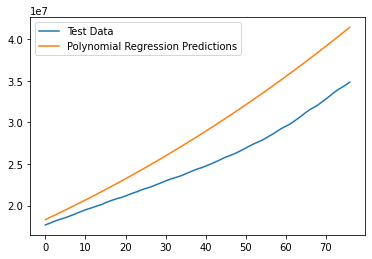

In [80]:
linear_pred, poly_MAE, poly_MSE = polynomial_regression()

In [81]:
from sklearn.metrics import confusion_matrix

### SVM Prediction Analysis

The similar process has been followed for Support Vector Machine (SVM) model for data processing which came from the above section. In the following section we are searching for the best Estimation using sklearn.svm library. Also, calculated the Mean Absolate and Mean Squred Error for SVM model.

In [82]:
def svm_analysis():
    # SVM Searching for best Estimation:
    svm_confirmed = SVR(shrinking=True,
                        kernel='poly',
                        gamma=0.01,
                        epsilon=1,
                        degree=5,
                        C=0.1)
    svm_confirmed.fit(X_train_confirmed, y_train_confirmed)
    svm_pred = svm_confirmed.predict(future_forecast)

    # Calculating Mean Absolute and Mean Squred Error for SVM prediction
    svm_test_pred = svm_confirmed.predict(X_test_confirmed)
    plt.plot(y_test_confirmed)
    plt.plot(svm_test_pred)
    plt.legend(['Test Data', 'SVM Predictions'])
    svm_MAE = mean_absolute_error(svm_test_pred, y_test_confirmed)
    svm_MSE = mean_squared_error(svm_test_pred, y_test_confirmed)
    print('Mean Absolute Error:', svm_MAE)
    print('Mean Squred Error:', svm_MSE)
    return svm_pred, svm_MAE, svm_MSE

Mean Absolute Error: 24815543.47994209
Mean Squred Error: 829885195160353.4


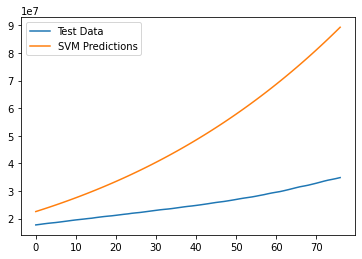

In [83]:
svm_pred, svm_MAE, svm_MSE = svm_analysis()

On the following section we are showing the future case predictions for the considered countries. We also added it for both Polynomial and SVM mode. Based on the both model we can understand that the polynomial regration is fitting best with our dataset. Important note: We are predicting data for upcoming three weeks.

In [84]:
# Plot for prediction
def plot_predictions(x, y, pred, algo_name, color):
    plt.figure(figsize=(16, 9))
    plt.plot(x, y)
    plt.plot(future_forecast, pred, linestyle='dashed', color=color)
    plt.title('Number of Covid-19 Cases Over Time', size=20)
    plt.xlabel('Days Since 1-23-2020', size=20)
    plt.ylabel('Number of Cases', size=20)
    plt.legend(['Confirmed Cases', algo_name], prop={'size': 20})
    plt.xticks(size=16)
    plt.yticks(size=16)
    plt.show()

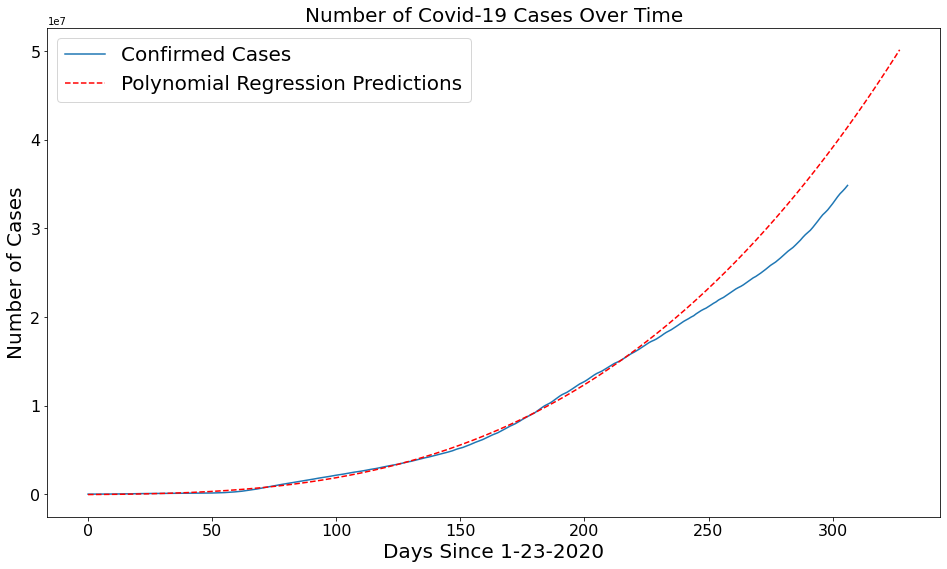

In [85]:
#print(adjusted_dates.shape,world_date_wise_cases.shape,linear_pred.shape)
plot_predictions(adjusted_dates, world_date_wise_cases, linear_pred,
                 'Polynomial Regression Predictions', 'red')

In our above graph we are trying to fit our model with our prediction for all consider countries. As we can see from the graph that the confirm cases most likely matches with our Polynomial regration model.

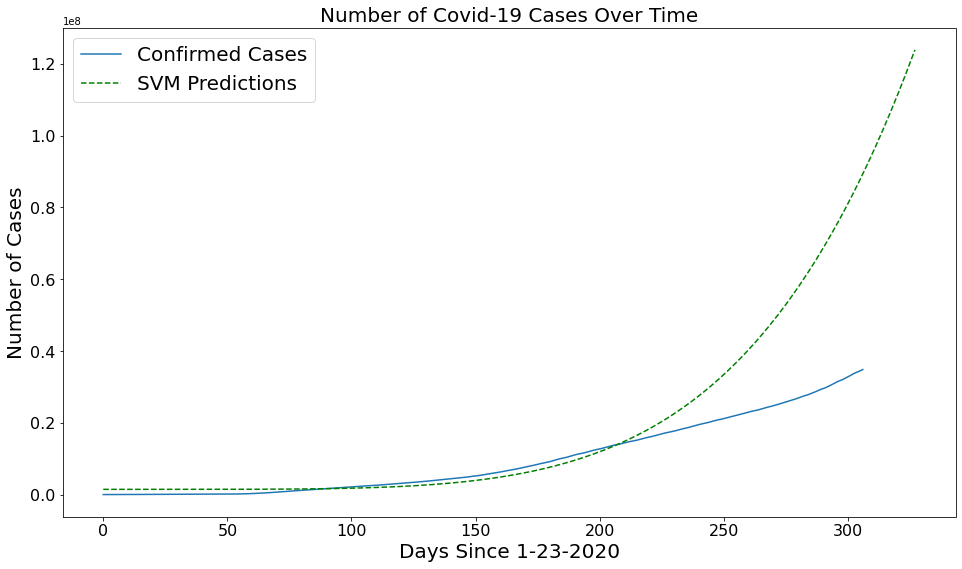

In [86]:
plot_predictions(adjusted_dates, world_date_wise_cases, svm_pred,
                 'SVM Predictions', 'green')

As we can see from the above plot that the SVM model prediction is not properly fitting with our data set when we consider all the countries.

In [87]:
# Predicting Future data using polynomial regression
linear_pred = linear_pred.reshape(1, -1)[0]
poly_data_pred = pd.DataFrame({
    'Date':
    future_forecast_dates[-21:],
    'Predicted number of Confirmed Cases on Considered Countries':
    np.round(linear_pred[-21:])
})
poly_data_pred.tail()

,Date,Predicted number of Confirmed Cases on Considered Countries
16,12/11/2020,48390127.0
17,12/12/2020,48823178.0
18,12/13/2020,49258808.0
19,12/14/2020,49697024.0
20,12/15/2020,50137835.0


The above table shows the pediction data for upcoming 21 days using the Polynomial Regration Model.

In [88]:
# Predicting Future data using SVM
svm_data_pred = pd.DataFrame({
    'Date':
    future_forecast_dates[-21:],
    'SVM Predicted # of Confirmed Cases Worldwide':
    np.round(svm_pred[-21:])
})
svm_data_pred.tail()

,Date,SVM Predicted # of Confirmed Cases Worldwide
16,12/11/2020,116584746.0
17,12/12/2020,118378112.0
18,12/13/2020,120193756.0
19,12/14/2020,122031884.0
20,12/15/2020,123892705.0


The above table shows the pediction data for upcoming 21 days using the SVM Model.

Comparison between Mean Absolute Error and Mean Squared Error for the both Model.

In [89]:
error_data = [(poly_MAE, poly_MSE), (svm_MAE, svm_MSE)]
#print(error_data)
df_obj = pd.DataFrame(
    error_data,
    columns=['Mean Absolute Error', 'Mean Squared Error'],
    index=['Polynomial Regression',
           'Support Vector Machines'])  # Showing data in table
df_obj

,Mean Absolute Error,Mean Squared Error
Polynomial Regression,3.807509e+06,1.839376e+13
Support Vector Machines,2.481554e+07,8.298852e+14


### Countrywise prediction

Showing Some of the Selected countries total case Status:

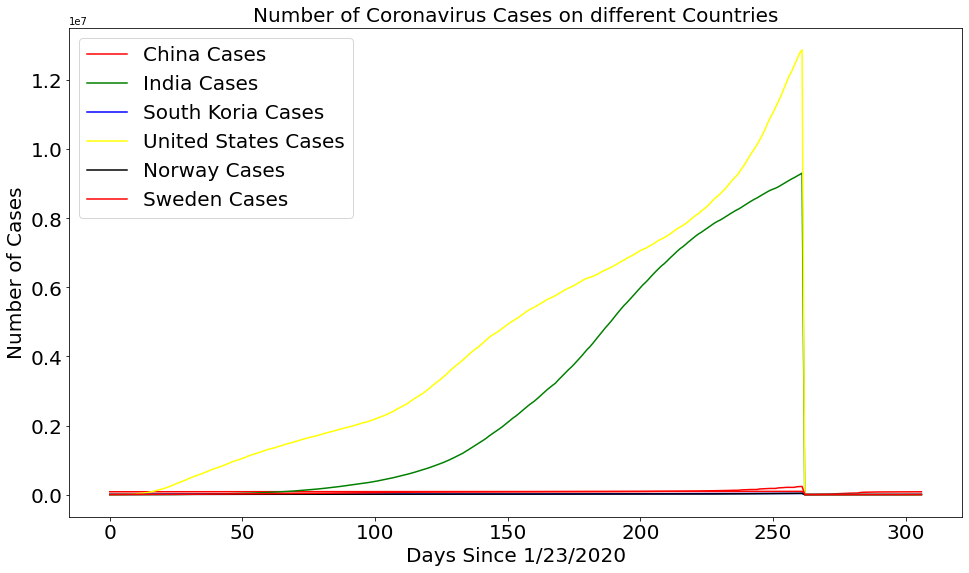

In [90]:
plt.figure(figsize=(16, 9))
plt.plot(adjusted_dates, china_cases, color='r')
plt.plot(adjusted_dates, india_cases, color='green')
plt.plot(adjusted_dates, SK_cases, color='blue')
plt.plot(adjusted_dates, US_cases, color='yellow')
plt.plot(adjusted_dates, norway_cases, color='black')
plt.plot(adjusted_dates, sweden_cases, color='r')
plt.legend([
    'China Cases', 'India Cases', 'South Koria Cases', 'United States Cases',
    'Norway Cases', 'Sweden Cases'
],
           loc='best',
           fontsize=20)
plt.title('Number of Coronavirus Cases on different Countries', size=20)
plt.xlabel('Days Since 1/23/2020', size=20)
plt.ylabel('Number of Cases', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

On the above plot we have just shown the plot for few countries with their total cases based on date since 01/23/2020.

Prediction Based on our model for Specific countries:

#### India Case Prediction

In [91]:
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(
    days_since_1_23, india_cases, test_size=0.20, shuffle=False)

Mean Absolute Error: 10488576.456875812
Mean Squres Error: 143171710379782.78


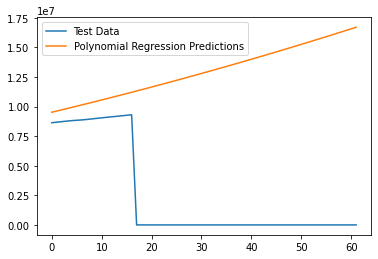

In [92]:
linear_pred, poly_MAE, poly_MSE = polynomial_regression()

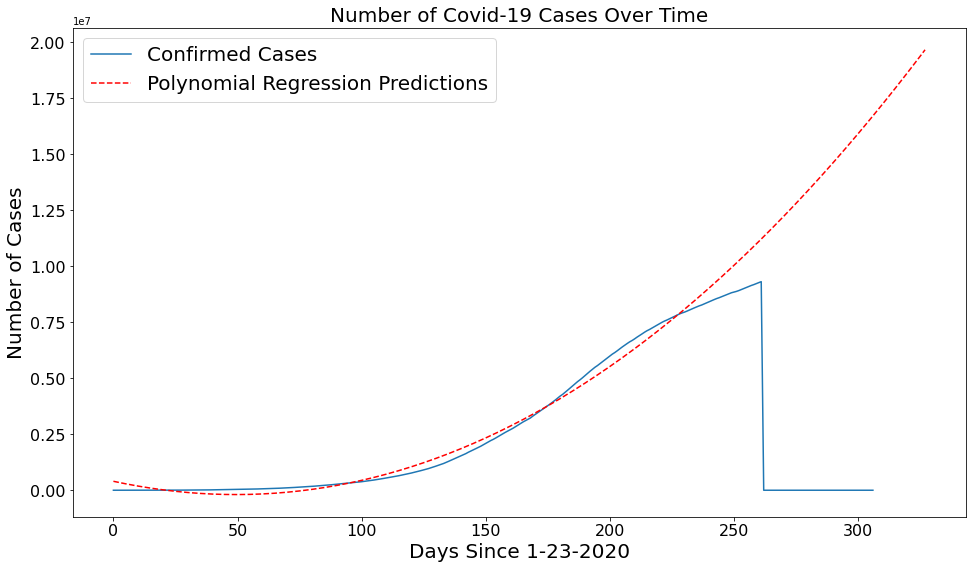

In [93]:
plot_predictions(adjusted_dates, india_cases, linear_pred,
                 'Polynomial Regression Predictions', 'red')

For the above plot we used the polynomial regration and for the individual country India which does not fit properly but there is no more distance between the prediction. Also we have shown the prediction amount on below table. 

In [94]:
# Predicting Future data for India using polynomial regression
linear_pred_india = linear_pred.reshape(1, -1)[0]
poly_data_pred1 = pd.DataFrame({
    'Date':
    future_forecast_dates[-21:],
    'Predicted number of Confirmed Cases India':
    np.round(linear_pred_india[-21:])
})
poly_data_pred1.head()

,Date,Predicted number of Confirmed Cases India
0,11/25/2020,16842802.0
1,11/26/2020,16978282.0
2,11/27/2020,17114322.0
3,11/28/2020,17250922.0
4,11/29/2020,17388082.0


#### Norway Case Prediction

In [95]:
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(
    days_since_1_23, norway_cases, test_size=0.25, shuffle=False)

Mean Absolute Error: 23744.49202763208
Mean Squres Error: 884406751.2501793


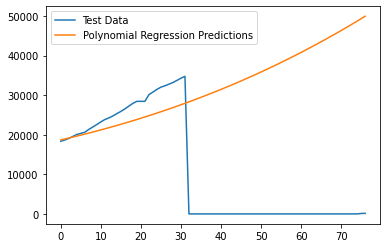

In [96]:
linear_pred, poly_MAE, poly_MSE = polynomial_regression()

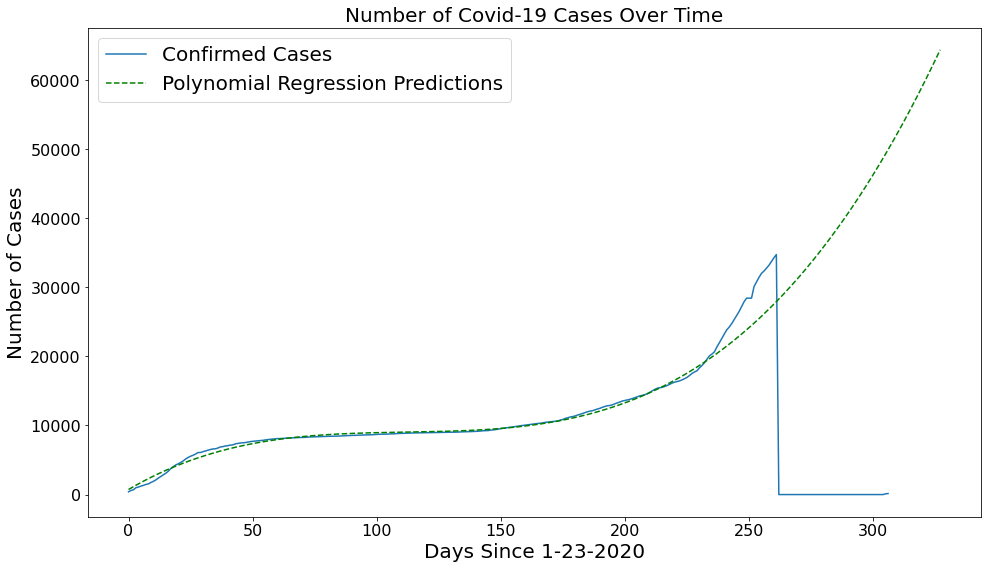

In [97]:
plot_predictions(adjusted_dates, norway_cases, linear_pred,
                 'Polynomial Regression Predictions', 'green')

For Norway the graph is fitted correctly for old data but for the prediction its not showing correct prediction for future using the Polynomial Regration.

#### United States Prediction

In [98]:
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(
    days_since_1_23, US_cases, test_size=0.30, shuffle=False)

Mean Absolute Error: 5664369.035538462
Mean Squres Error: 57129930798864.92


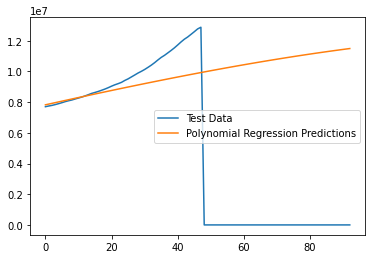

In [99]:
linear_pred, poly_MAE, poly_MSE = polynomial_regression()

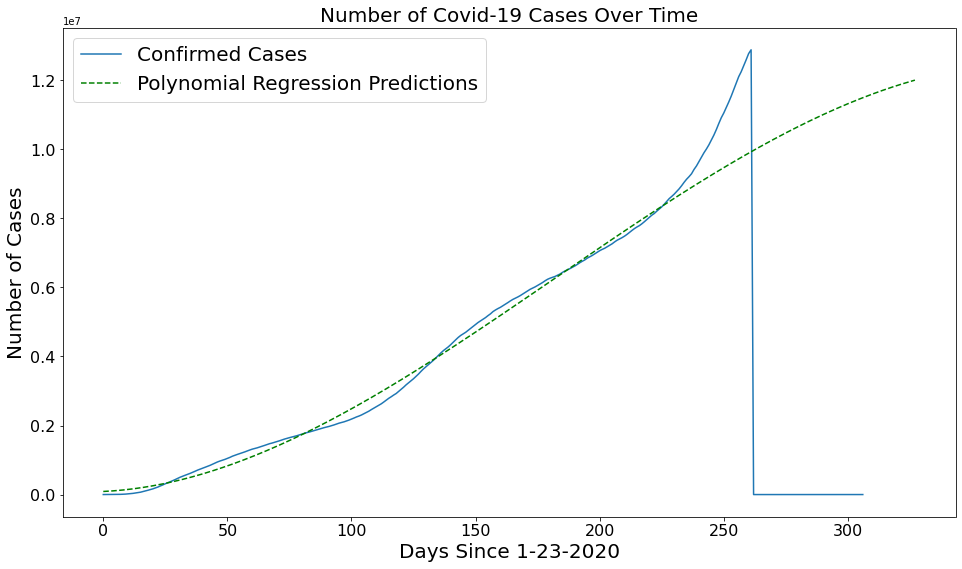

In [100]:
plot_predictions(adjusted_dates, US_cases, linear_pred,
                 'Polynomial Regression Predictions', 'green')

The graph shows the Number of cases prediction for United States and the prdiction values shown on the below table.

In [101]:
# Predicting Future data for India using polynomial regression
linear_pred_india = linear_pred.reshape(1, -1)[0]
poly_data_pred1 = pd.DataFrame({
    'Date':
    future_forecast_dates[-21:],
    'Predicted number of Confirmed Cases India':
    np.round(linear_pred_india[-21:])
})
#poly_data_pred1.head()

### Random Forest Regression


Here, the Random Forest Regressor will be used in combination with the StandardScaler through a pipeline. The random forest regressor will use multiple decision trees to create a robust prediction model. The average result from multiple randomly constructed decision trees will increase accuracy while reducing possibility of overfitting the regression[6].

For this method we will try to collect the target data, 'new_cases' and 'new_deaths', in one column to predict both at the same time. This is done by duplicating the rows, adding a column, 'target_values' where cases and deaths are applied to every other row, and then apply an indicatior for which row correnspond to deaths and which correnspond to cases. Then the case and death columns are dropped from the dataframe. Then the dataframe is splitted into a train portion and a test portion for every location and merged into a train and a test dataframe.

In [102]:
def get_train_and_test_df_new(
        dataframe_in,
        columns=['new_cases_smoothed', 'new_deaths_smoothed'],
        train_portion=0.8,
        one_column=False):
    """
    The function is manipulating the dataframe to store target data in the same column,
    adding an indicator to differ between the data type(cases or deaths).
    Then splits the dataframe into a train dataframe and a test dataframe assosiated to the train_portion parameter. 
    
    :param dataframe_in:   Dataframe to manipulate with target data and assosiated features
    :param columns:        List of columns to be considered as target data. Single string if one_colum == True.
    :param train_portion:  Number between 0, 1. The portion of dataframe to be used in training.
    :param one_column:     Bool needs to be True in order to only consider one column
    """
    df_train = pd.DataFrame()
    df_test = pd.DataFrame()
    for location in dataframe_in.location.unique():
        df_location = dataframe_in.loc[dataframe_in.location ==
                                       location].reset_index()
        if one_column:
            df_location_new = df_location
            df_location_new['target_values'] = df_location[columns]
            df_location_new['cases/deaths'] = 0
        else:
            df_location_target = pd.DataFrame()
            for i, row in df_location.iterrows():
                df_location_target.loc[2 * i, 'TargetValues'] = row[columns[0]]
                df_location_target.loc[2 * i, 'Cases/Deaths'] = 0
                df_location_target.loc[2 * i + 1,
                                       'TargetValues'] = row[columns[1]]
                df_location_target.loc[2 * i + 1, 'Cases/Deaths'] = 1
            df_location_new = pd.DataFrame(
                np.repeat(df_location.values, 2, axis=0))
            df_location_new.columns = df_location.columns
            df_location_new['target_values'] = df_location_target[
                'TargetValues']
            df_location_new['cases/deaths'] = df_location_target[
                'Cases/Deaths']
        df_location_new = df_location_new.drop(columns, axis=1)
        index_of_80 = df_location_new.shape[0] * train_portion
        if (index_of_80 % 2) == 1:
            print('added')
            index_of_80 += 1
        df_train = df_train.append(
            df_location_new.loc[df_location_new.index < index_of_80, :],
            ignore_index=True)
        df_test = df_test.append(
            df_location_new.loc[df_location_new.index > index_of_80 - 1, :],
            ignore_index=True)
    df_train = df_train.drop('index', axis=1)
    df_test = df_test.drop('index', axis=1)
    return df_train, df_test

In [103]:
df_pipeline = df[[
    'location',  #'total_cases_per_million',#
    'new_cases_smoothed',  # 'new_deaths_smoothed_per_million',
    # 'total_cases',
    'new_deaths_smoothed',
    'population',
    'population_density',
    'median_age',
    'aged_65_older',
    'aged_70_older',
    'gdp_per_capita',
    'extreme_poverty',
    'cardiovasc_death_rate',
    'diabetes_prevalence',
    'female_smokers',
    'male_smokers',
    'hospital_beds_per_thousand',
    'life_expectancy',
    'human_development_index',
    'days_after_100_cases'
]]

df_pipeline = df_pipeline.fillna(0.0)
df_pipeline = df_pipeline.sort_values(['location', 'days_after_100_cases'
                                       ]).reset_index(drop=True)

l = LabelEncoder()
X = df_pipeline.iloc[:, 0].values
df_pipeline.iloc[:, 0] = l.fit_transform(X)

df_train, df_test = get_train_and_test_df_new(
    df_pipeline,
    train_portion=0.9,
    columns=['new_cases_smoothed', 'new_deaths_smoothed'])

y_train_forest = df_train['target_values'].to_numpy()
x_train_forest = df_train.drop(['target_values'], axis=1).to_numpy()
y_test_forest = df_test['target_values'].to_numpy()
x_test_forest = df_test.drop(['target_values'], axis=1).to_numpy()

model = Pipeline([('scaler2', StandardScaler()),
                  ('RandomForestRegressor: ', RandomForestRegressor())])
model.fit(x_train_forest, y_train_forest)
prediction = model.predict(x_test_forest)
model.score(x_test_forest, y_test_forest)

added
added


0.7945245479657692

In [104]:
def plot_prediction(x_training,
                    y_training,
                    x_testing,
                    y_testing,
                    y_prediction,
                    case_death=0,
                    from_day=0):
    """
    Plots the prediction along with test data and training data.
    
    :param x_training:  x values from training data
    :param y_training:  y values from training data
    :param x_testing:   x values assosiated to predicted data as well as comparing data(y_testing)
    :param y_testing:   y values to compare with predicted data
    :param dase_death:  indexer to choose between death data and case data. 0 will give case, 1 will give death
    :param from_day:    integer, how many days after 100 confirmed cases to start plotting
    """
    fig, axes = plt.subplots(4, 4, figsize=(15, 15))
    fig.suptitle(
        'Random Forest Regression\nComparing test data and prediction for {}'.
        format('new cases' if case_death == 0 else 'new deaths'),
        fontsize=25)
    fig.tight_layout(pad=3.0)
    plt.subplots_adjust(top=0.90)
    for location, ax in enumerate(fig.axes):
        x_location_train = x_training[
            (x_training[:, 0].astype(int) == location)
            & (x_training[:, -1].astype(int) == case_death)]
        y_location_train = y_training[
            (x_training[:, 0].astype(int) == location)
            & (x_training[:, -1].astype(int) == case_death)]

        x_location_test = x_testing[
            (x_testing[:, 0].astype(int) == location)
            & (x_testing[:, -1].astype(int) == case_death)]
        y_location_test = y_testing[
            (x_testing[:, 0].astype(int) == location)
            & (x_testing[:, -1].astype(int) == case_death)]

        y_location_predicted = y_prediction[
            (x_testing[:, 0].astype(int) == location)
            & (x_testing[:, -1].astype(int) == case_death)]
        try:
            ax.set_title(l.inverse_transform([location])[0])
        except:
            print('out of bounds')
        ax.plot(x_location_train[from_day:, -2],
                y_location_train[from_day:],
                label='Train')
        ax.plot(x_location_test[:, -2], y_location_test, label='Test')
        ax.plot(x_location_test[:, -2],
                y_location_predicted,
                label='Predicted')
        ax.set_xlabel('Days after 100 confirmed cases', fontsize=10)
        ax.set_ylabel('new cases' if case_death == 0 else 'new deaths',
                      fontsize=10)

        ax.legend()

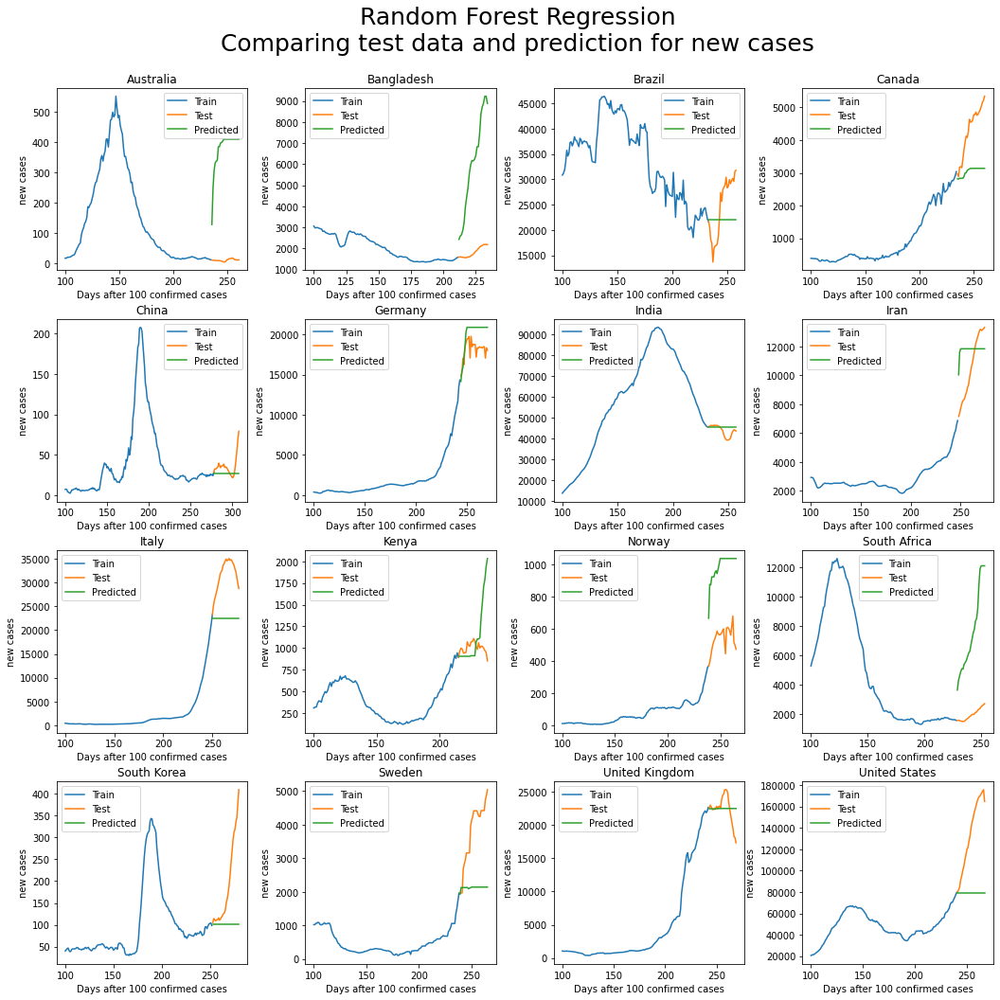

In [105]:
plot_prediction(x_train_forest,
                y_train_forest,
                x_test_forest,
                y_test_forest,
                prediction,
                from_day=100)

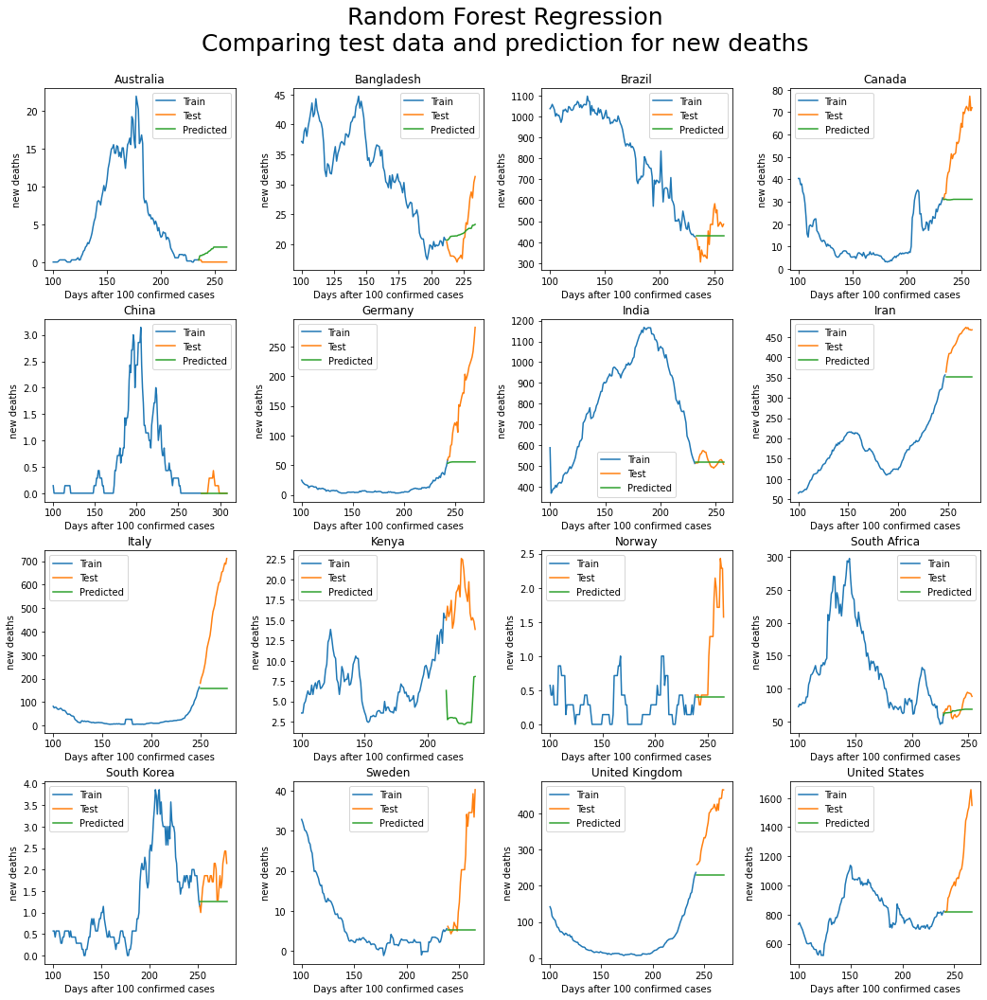

In [106]:
plot_prediction(x_train_forest,
                y_train_forest,
                x_test_forest,
                y_test_forest,
                prediction,
                case_death=1,
                from_day=100)

As one can observe from the plots of new cases and new deaths, the model will only be eligible to describe a few countries, as the prediction is abbrieviating for most countries, which characterize an unstable model. Therefore we choose not to further develop on this method.

### Gradient Boosting - LightGBM

LightGBM is a gradient boosting framework which is based on decision tree learning with leaf-wise growth, and offers a wide variety of control parameters to avoid over/underfit as well as computational power[6]. In this section, we will use the traditional Gradient Boosting Decision Tree together with the basic parameters to predict total deaths per million for the selected countries.

In [107]:
def process_data_and_split(df, scaler, scaler2):
    """
    The function takes the covid-19 dataframe and transforms the data 
    for prediction purposes, and returns train and test sets.
    
    :param scaler:  MinMaxScaler object
    :param scaler2: MinMaxScaler object
    """

    p_data = df[[
        'location', 'date', 'total_deaths_per_million',
        'cardiovasc_death_rate', 'aged_65_older', 'diabetes_prevalence',
        'female_smokers', 'male_smokers', 'human_development_index',
        'new_deaths_smoothed_per_million', 'hospital_beds_per_thousand',
        'life_expectancy', 'population'
    ]]

    # process the data
    p_data['smokers'] = p_data.female_smokers + p_data.male_smokers
    p_data.drop(['female_smokers', 'male_smokers'], axis=1)

    p_data.loc[:, 'date'] = pd.to_datetime(p_data['date'])
    p_data.loc[:, 'dayofyear'] = p_data['date'].dt.dayofyear
    p_data = p_data.reset_index(drop=True)

    p_data.loc[:, 'dayofyear'] = p_data['dayofyear']

    # Create time lagged data
    p_data['yd_deaths'] = p_data['total_deaths_per_million'].shift(1)
    p_data['yd_deaths2'] = p_data['total_deaths_per_million'].shift(2)

    p_data['total_deaths_per_million'] = scaler2.fit_transform(
        p_data[['total_deaths_per_million']])

    # split into train-test
    train = p_data[p_data['dayofyear'] <= 300]
    test = p_data[p_data['dayofyear'] > 300]

    categorical_features = ['location']
    for c in categorical_features:
        train[c] = train[c].astype('category')
        test[c] = test[c].astype('category')

    #train['dayofyear'] = train['dayofyear'].astype('int64')

    y_train = train['total_deaths_per_million']
    x_train = train[[
        'location', 'dayofyear', 'yd_deaths', 'yd_deaths2',
        'cardiovasc_death_rate', 'aged_65_older',
        'new_deaths_smoothed_per_million', 'diabetes_prevalence', 'smokers',
        'human_development_index', 'hospital_beds_per_thousand',
        'life_expectancy'
    ]]

    x_train[[
        'cardiovasc_death_rate', 'aged_65_older',
        'new_deaths_smoothed_per_million', 'diabetes_prevalence', 'smokers',
        'human_development_index', 'hospital_beds_per_thousand',
        'life_expectancy', 'yd_deaths', 'yd_deaths2'
    ]] = scaler.fit_transform(x_train[[
        'cardiovasc_death_rate', 'aged_65_older',
        'new_deaths_smoothed_per_million', 'diabetes_prevalence', 'smokers',
        'human_development_index', 'hospital_beds_per_thousand',
        'life_expectancy', 'yd_deaths', 'yd_deaths2'
    ]])

    x_test = test[[
        'location', 'dayofyear', 'yd_deaths', 'yd_deaths2',
        'cardiovasc_death_rate', 'aged_65_older',
        'new_deaths_smoothed_per_million', 'diabetes_prevalence', 'smokers',
        'human_development_index', 'hospital_beds_per_thousand',
        'life_expectancy'
    ]]

    x_test[[
        'cardiovasc_death_rate', 'aged_65_older',
        'new_deaths_smoothed_per_million', 'diabetes_prevalence', 'smokers',
        'human_development_index', 'hospital_beds_per_thousand',
        'life_expectancy', 'yd_deaths', 'yd_deaths2'
    ]] = scaler.fit_transform(x_test[[
        'cardiovasc_death_rate', 'aged_65_older',
        'new_deaths_smoothed_per_million', 'diabetes_prevalence', 'smokers',
        'human_development_index', 'hospital_beds_per_thousand',
        'life_expectancy', 'yd_deaths', 'yd_deaths2'
    ]])
    y_test = test['total_deaths_per_million']

    return x_train, y_train, x_test, y_test


scaler = MinMaxScaler(feature_range=(0, 1))
scaler2 = MinMaxScaler(feature_range=(0, 1))
x_train, y_train, x_test, y_test = process_data_and_split(df, scaler, scaler2)

[LightGBM] [Info] Total Bins 1138
[LightGBM] [Info] Number of data points in the train set: 3756, number of used features: 12
[LightGBM] [Info] Start training from score 0.194045


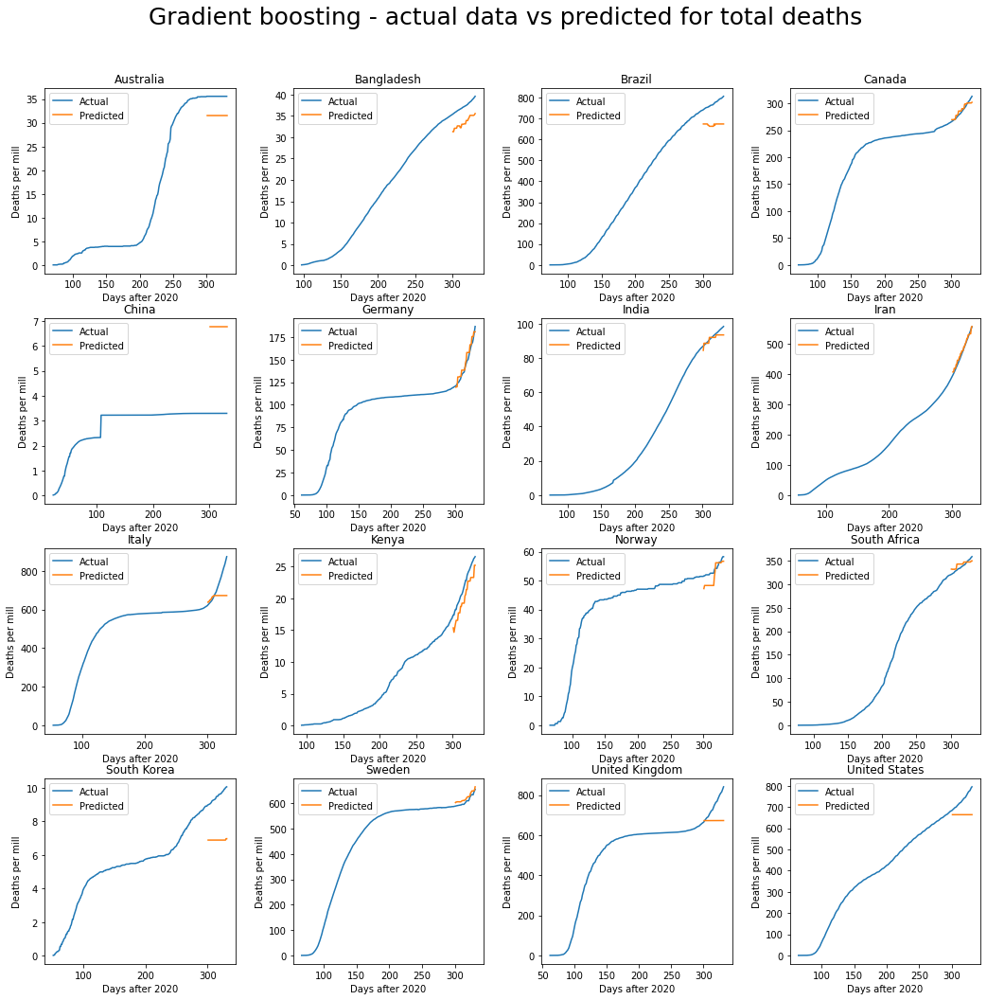

In [108]:
# Create an lgbm dataset with our training set
lgb_train = lgbm.Dataset(x_train,
                         label=y_train,
                         categorical_feature=['location'])

# Initialize lgbm parameters for regression
LGB_PARAMS = {
    "objective": "regression",
    "force_col_wise": True,
    "num_leaves": 4,
    #"min_data_in_leaf": 4,
    #"max_depth": 6,
    "learning_rate": 0.01,
    #"bagging_freq": 5,
    #"bagging_fraction": 0.6,
    "feature_fraction": 0.82,
    "reg_alpha": 1,
    "reg_lambda": 4.7,
    "seed": 21,
    "metric": ["mape", "mse"],
    #"verbosity": 100,
    #"min_gain_to_split":0.02
}

# Train the model
model = lgbm.train(LGB_PARAMS, train_set=lgb_train, num_boost_round=1000)

# Predict test set
y_pred = model.predict(x_test, num_boost_round=1200)

# Re-construct our initial dataframe with the addition of prediction data
x_test['predicted'] = y_pred
x_test['predicted'] = scaler2.inverse_transform(x_test[['predicted']])
x_test['total_deaths_per_million'] = y_test
x_test['total_deaths_per_million'] = scaler2.inverse_transform(
    x_test[['total_deaths_per_million']])
x_train['predicted'] = np.nan
x_train['total_deaths_per_million'] = y_train
x_train['total_deaths_per_million'] = scaler2.inverse_transform(
    x_train[['total_deaths_per_million']])

full_df = pd.concat([x_train, x_test])

# Plot the dataframe for each country, visualizing actual vs predicted values
fig, axes = plt.subplots(4, 4, figsize=(15, 15))

grouped = full_df.groupby('location')
targets = zip(grouped.groups.keys(), axes.flatten())
fig.tight_layout(pad=3.0)
plt.subplots_adjust(top=0.90)
fig.suptitle('Gradient boosting - actual data vs predicted for total deaths',
             fontsize=25)
for i, (key, ax) in enumerate(targets):
    temp = grouped.get_group(key)
    ax.plot(temp['dayofyear'],
            temp['total_deaths_per_million'],
            label='Actual')
    ax.plot(temp['dayofyear'], temp['predicted'], label='Predicted')
    ax.set_title(key)
    ax.set_xlabel('Days after 2020')
    ax.set_ylabel('Deaths per mill')
    ax.legend()
plt.show()

Prediction results with the LightGBM framework seem quite off for some countries, but good for other ones. This could potentially be due to the model parameters chosen, or because of the trend dissimilarity among the considered countries. Further development for this model can be to derive additional time-lagged features, and to get a deeper understanding of the tuning parameters.

## Conclusion

The cleaning part can be considered successful when considering the amount of NaN-values left in the data frame. The integrity of the data may have been compromised to some extent, but not to a degree that is visibly unreasonable when plotting the exposed columns. In terms of correlation among the parameters it was hard to find any correlation among the infection cases and the other social parameters rather a generic positive correlation between the death and identified cases is observed.Polynomial and LSTM models are proven to best fit the data. Other methods tend to abbreviate from the data.

## Summary


In this project we have used the dataset given for the project to study and evaluate the spread of the pandemic worldwide.
We have used the dataset to cluster countries/locations based on cororna-cases and fatalities. The Hierarchical agglomerative method based on distance calculated using dynamic time warping(DTW) and 2-Kmean method have given us dsireable results, which tones with the current situation of the pandemic. In contrast, the results attained from row-wise Kmean method are not tremendously sensible and that is for the reason that we have included more features when using this method.   

On the prediction part we have used several methods to forecaste the cororna-cases/death count a few days into the future. The results indicates that some of the methods such as LSTM and Polynomial regresion can be somewhat accepted as a reliable methods for forecasting about the future values on our historical data points. However, the results obtained from the methods using all the features are strange numbers and do not reflect the actual data. 




## Reflections


This project reflects the following core factors:

1. We are introduced the most usable data analysys tools called scikit-learn and the various uses of this tool.
2. As cleaning is the most important part of this project we have performed cleaning of data by dropping columns, searching for missing data, interpolating, and combining columns in the dataset.
3. In the clustering part we have introduced various kinds of clustering including Kmeans, Agglomerative and DBscan. Also, we have got the clear concept about these clustering and shown the comparison among them.
4. For the final part of this project we have implemented several models. For instance LSTM-Prediction Method, Polynomial Regration, Support Vector Machine and Random Forest Regression. By using all these method we are trying to predict for the future.
5. This project really open the door to research more in future and try to choose any better thesis topics.   



## References

1. **Owid**, *Covid-19-data*, 29.11.2020, https://github.com/owid/covid-19-data
2. **COVID-19 Data Portal Sweden**, *National Pandemic Centre SARS-CoV-2 (COVID-19) test statistics*, https://covid19dataportal.se/data_types/health_data/npc-statistics/
3. **DigitalVidya**, *8 Ways to Clean Data Using Data Cleaning Techniques*, 07.12.2020 https://www.digitalvidya.com/blog/data-cleaning-techniques/
4. **The World Bank Group**, *Poverty headcount ratio at $1.90 a day (2011 PPP) (% of population)*, 30.11.2020, https://data.worldbank.org/indicator/SI.POV.DDAY
5. **scikit-learn**, *Plot Hierarchical Clustering Dendrogram*, 05.12.2020, https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#plot-hierarchical-clustering-dendrogram
6. **Derrick Mwiti**, *Random Forest Regression: When Does It Fail and Why?*, 07.12.2020, https://neptune.ai/blog/random-forest-regression-when-does-it-fail-and-why
7. **Rohit Dwivedi**, *What is LightGBM Algorithm, How to use it?*, 07.12.2020,https://www.analyticssteps.com/blogs/what-light-gbm-algorithm-how-use-it